In [ ]:
# Importing packages, functions and datasets

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from scipy.signal import coherence
from scipy.optimize import curve_fit
from mpl_toolkits.mplot3d import Axes3D

import sys
sys.path.insert(0, r'C:\Users\jeanv\OneDrive - Delft University of Technology\Uitwisseling - TUDelft\Courses\MEP\Programming\extra')


from gradientAnalysis.functions import find_plateaus, analyze_drift, savgolCompilator, rangeSelector, coherenceData, powerlaw, powerlawFitter, singleWelch

from gradientAnalysis.dataPreparation import timerun2_1, CH0run2_1, CH1run2_1, CH2run2_1, CH3run2_1, timerun2_2, CH0run2_2, CH1run2_2, CH2run2_2, CH3run2_2, timerun3_1, CH0run3_1, CH1run3_1, CH2run3_1, CH3run3_1, timerun3_2, CH0run3_2, CH1run3_2, CH2run3_2, CH3run3_2
from gradientAnalysis.dataPreparation import temperatureTime_run2_1, temperatureTime_run3_1, temperatureTime_run3_2
from gradientAnalysis.dataPreparation import immersionTime_run2_1, immersionTime_run3_1, immersionTime_run3_2
from gradientAnalysis.dataPreparation import events_run2


from gradientAnalysis.plots import channelPlotter, coherencePlotter, coherenceFitPlotter, experimentPlotter, plot_thermal_results, savgolCalcPlotter, plotOverviewDashboard


Time length: 8932


C:\Users\jeanv\OneDrive - Delft University of Technology\Uitwisseling - TUDelft\Courses\MEP\Programming\extra\gradientAnalysis\plots.py:165: SyntaxWarning: invalid escape sequence '\p'
  label='Measured Exponent $b \pm \sigma$', markersize=0.5)
C:\Users\jeanv\OneDrive - Delft University of Technology\Uitwisseling - TUDelft\Courses\MEP\Programming\extra\gradientAnalysis\plots.py:193: SyntaxWarning: invalid escape sequence '\p'
  label='Coherence $b \pm \sigma$')


## Immersion Depth and Furnace Temperature profiles

Plot 1: Run 2 \
Plot 2: Run 3.1 & Run 3.2 combined

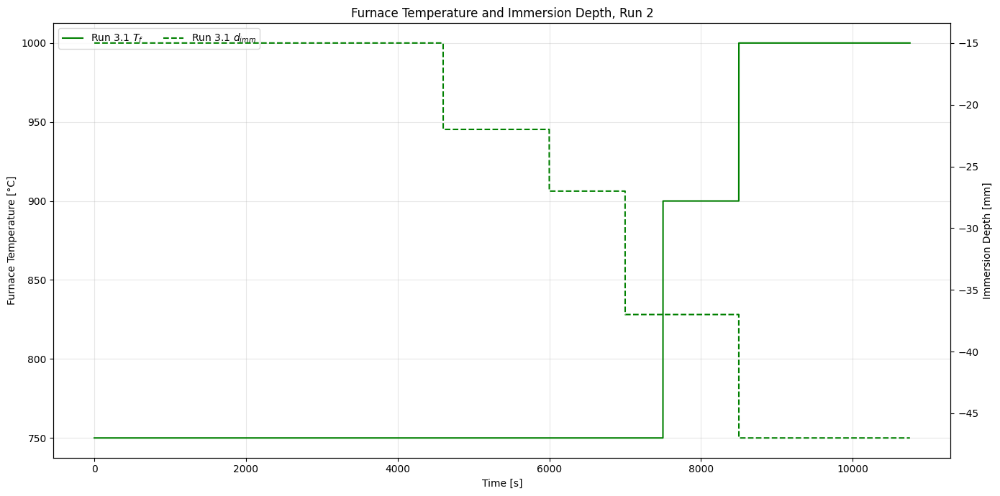

In [ ]:
# Furnace Temperature and Immersion Depth: Run 2

fig, ax1 = plt.subplots(figsize=(14, 7))
ax2 = ax1.twinx()

ax1.plot(temperatureTime_run2_1[:, 0], temperatureTime_run2_1[:, 1], 
         color='green', label='Run 3.1 $T_f$', lw=1.5)
ax2.plot(immersionTime_run2_1[:, 0], immersionTime_run2_1[:, 1], 
         color='green', label='Run 3.1 $d_{imm}$', ls='--', lw=1.5)

ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Furnace Temperature [°C]')
ax2.set_ylabel('Immersion Depth [mm]')
ax1.set_title('Furnace Temperature and Immersion Depth, Run 2')
ax1.grid(True, alpha=0.3)
# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='best', ncol=2)

plt.tight_layout()
plt.show()

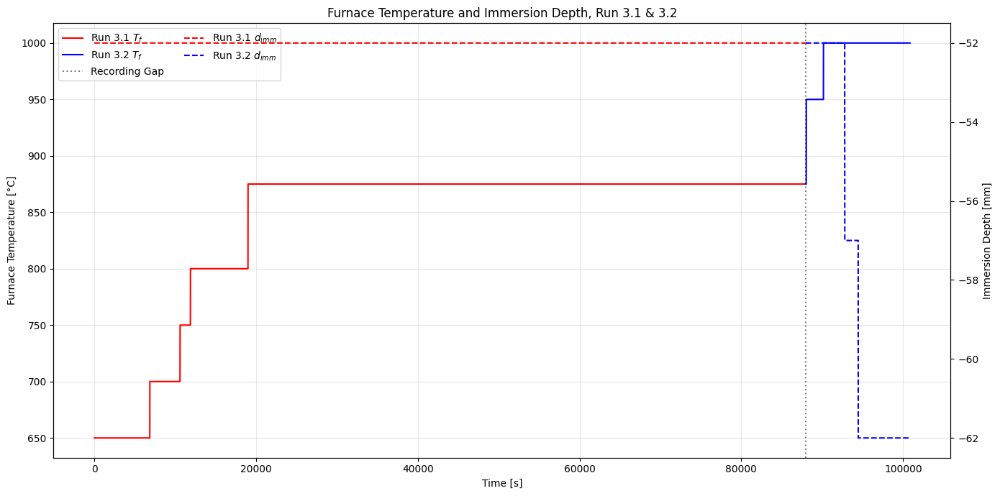

<Figure size 640x480 with 0 Axes>

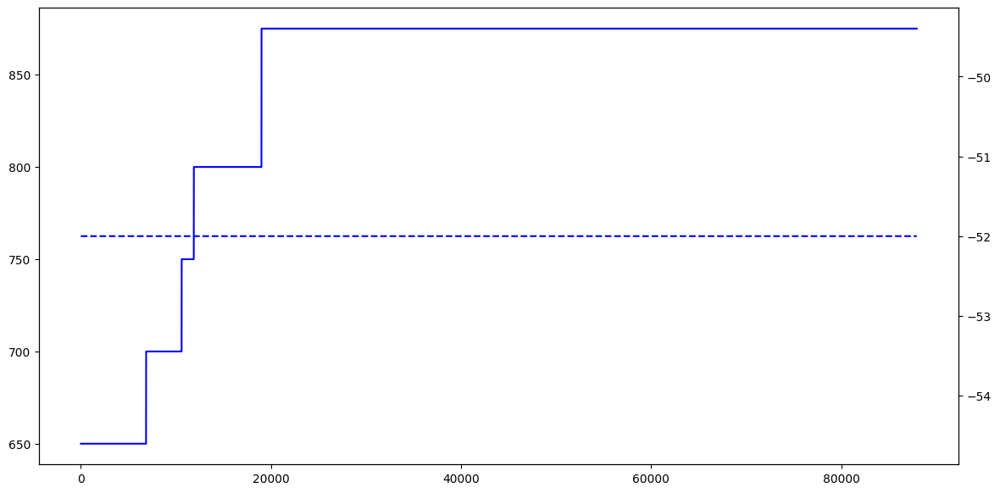

In [ ]:
# Furnace Temperature and Immersion Depth: Run 3.1 and Run 3.2
offset = temperatureTime_run3_1[-1, 0] 

# Shift time of Run 3_2
timerun3_2_shifted = temperatureTime_run3_2[:, 0] + offset
# Do the same for immersion time
immersion_time_run3_2_shifted = immersionTime_run3_2[:, 0] + offset

fig, ax1 = plt.subplots(figsize=(14, 7))
ax2 = ax1.twinx()

ax1.plot(temperatureTime_run3_1[:, 0], temperatureTime_run3_1[:, 1], 
         color='red', label='Run 3.1 $T_f$', lw=1.5)
ax2.plot(immersionTime_run3_1[:, 0], immersionTime_run3_1[:, 1], 
         color='red', label='Run 3.1 $d_{imm}$', ls='--', lw=1.5)

# Plot Run 2 (Shifted Time)
ax1.plot(timerun3_2_shifted, temperatureTime_run3_2[:, 1], 
         color='blue', label='Run 3.2 $T_f$', lw=1.5)
ax2.plot(immersion_time_run3_2_shifted, immersionTime_run3_2[:, 1], 
         color='blue', label='Run 3.2 $d_{imm}$', ls='--', lw=1.5)

# 
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Furnace Temperature [°C]')
ax2.set_ylabel('Immersion Depth [mm]')
ax1.set_title('Furnace Temperature and Immersion Depth, Run 3.1 & 3.2')
ax1.grid(True, alpha=0.3)

# Add a vertical line where the "Stitch" happened
ax1.axvline(offset, color='black', ls=':', alpha=0.5, label='Recording Gap')

# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='best', ncol=2)

plt.tight_layout()
plt.show()


plt.figure()
timerun3_2_shifted = temperatureTime_run3_2[:, 0]
# Do the same for immersion time
immersion_time_run3_2_shifted = immersionTime_run3_2[:, 0]



fig, ax = plt.subplots(figsize=(14, 7))
ax.plot(temperatureTime_run3_1[:, 0], temperatureTime_run3_1[:, 1], 
         color='blue', label='Run 3.2 $T_f$', lw=1.5)
ax2=ax.twinx()
ax2.plot(immersionTime_run3_1[:, 0], immersionTime_run3_1[:, 1], 
         color='blue', label='Run 3.2 $d_{imm}$', ls='--', lw=1.5)


# 4-Channel Plotting

Plotting channels 0-3 for Run 2, Run 3.1 and Run 3.2

In [ ]:
# Colors and Label Names

colors = ['#2E5C36', '#00DB27', "#8A424F", '#DB0028']
labels = ["Upper salt (Cold salt)", "Lower salt (Hot salt)", "Upper crucible (Outer cold)", "Lower crucible (Outer hot)"]


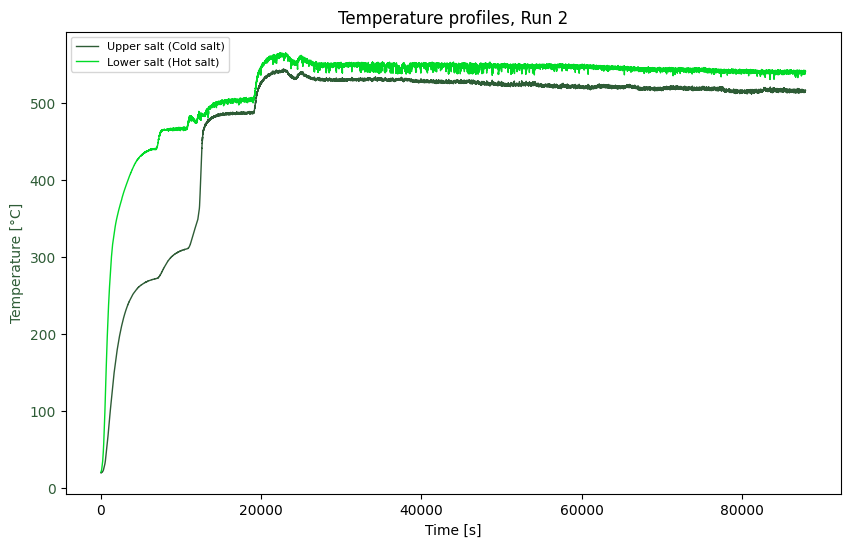

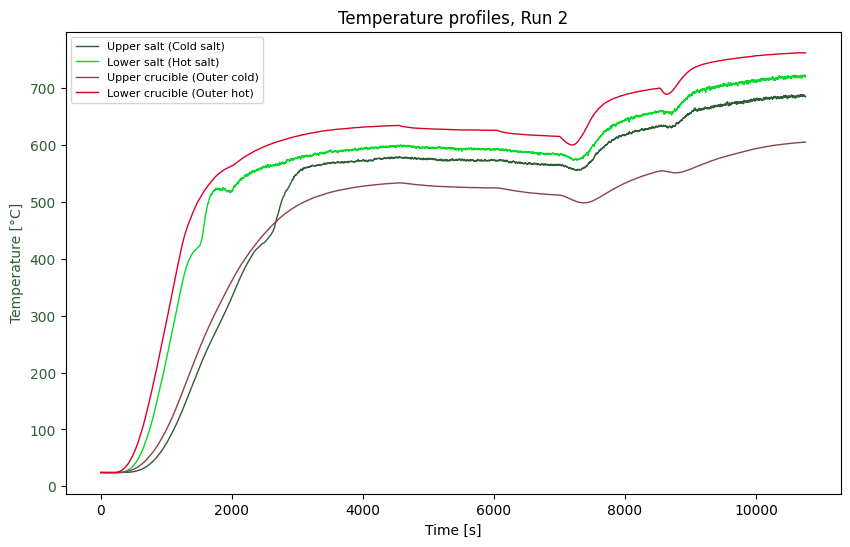

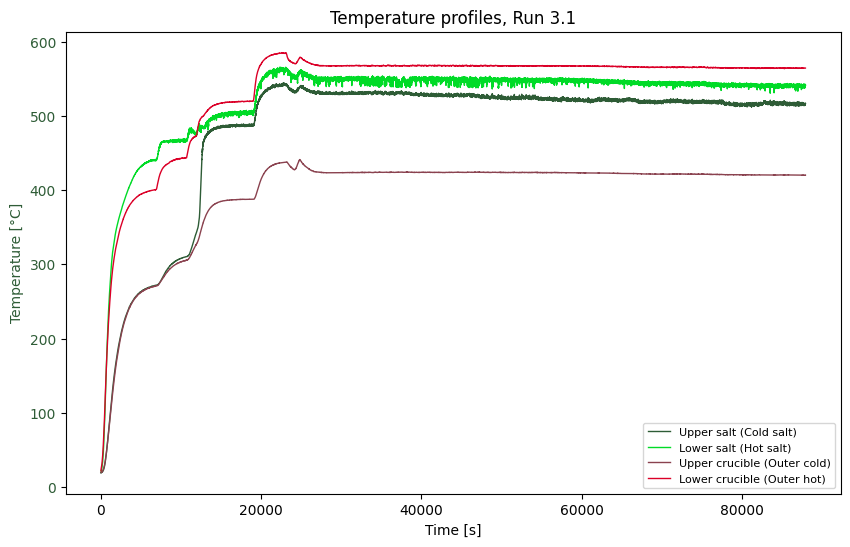

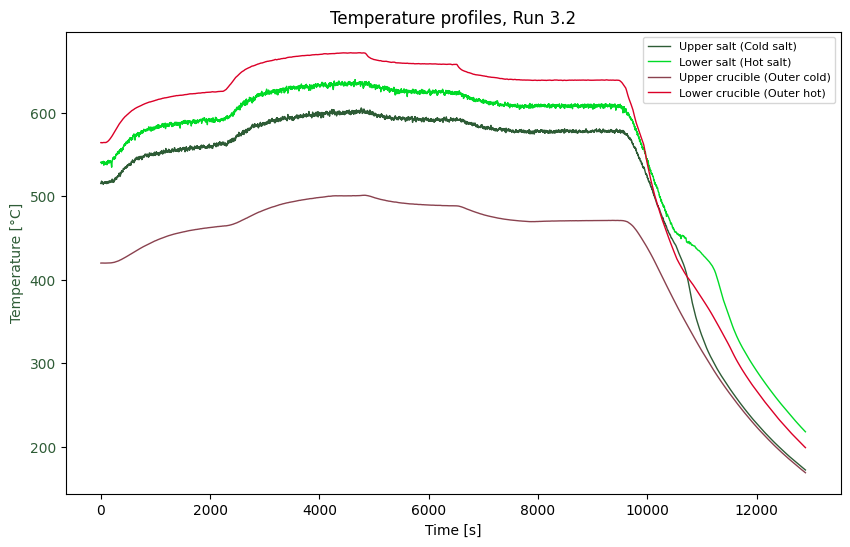

In [ ]:
# Channel 0-3 Plots for Run 2, Run 3.1 and Run 3.2
plot1 = channelPlotter([CH0run3_1, CH1run3_1], [timerun3_1], 
                      "Temperature profiles, Run 2", 
                      colors, None, None, labels=labels, linestyles=["-"])
# Channel 0-3 Plots for Run 2, Run 3.1 and Run 3.2
plot1 = channelPlotter([CH0run2_1, CH1run2_1, CH2run2_1, CH3run2_1], [timerun2_1], 
                      "Temperature profiles, Run 2", 
                      colors, None, None, labels=labels, linestyles=["-"])


plot2 = channelPlotter([CH0run3_1, CH1run3_1, CH2run3_1, CH3run3_1], [timerun3_1], 
                      "Temperature profiles, Run 3.1", 
                      colors, None, None, labels=labels, linestyles=["-"])

plot3 = channelPlotter([CH0run3_2, CH1run3_2, CH2run3_2, CH3run3_2], [timerun3_2], 
                      "Temperature profiles, Run 3.2", 
                      colors, None, None, labels=labels, linestyles=["-"])



# Zoom on Channels in Run

With this zoom, we can identify the steady state region and later perform linear regression in a region of choice

In [ ]:
#Single Channel Tester (Run 3.1, CH1)
# singlechannel = channelPlotter([CH1run3_1], [timerun3_1], 
#                       "Temperature profiles, Run 3.1", 
#                       np.array([colors[1]]), [26000, 87000], None, labels=labels, linestyles=["-"])




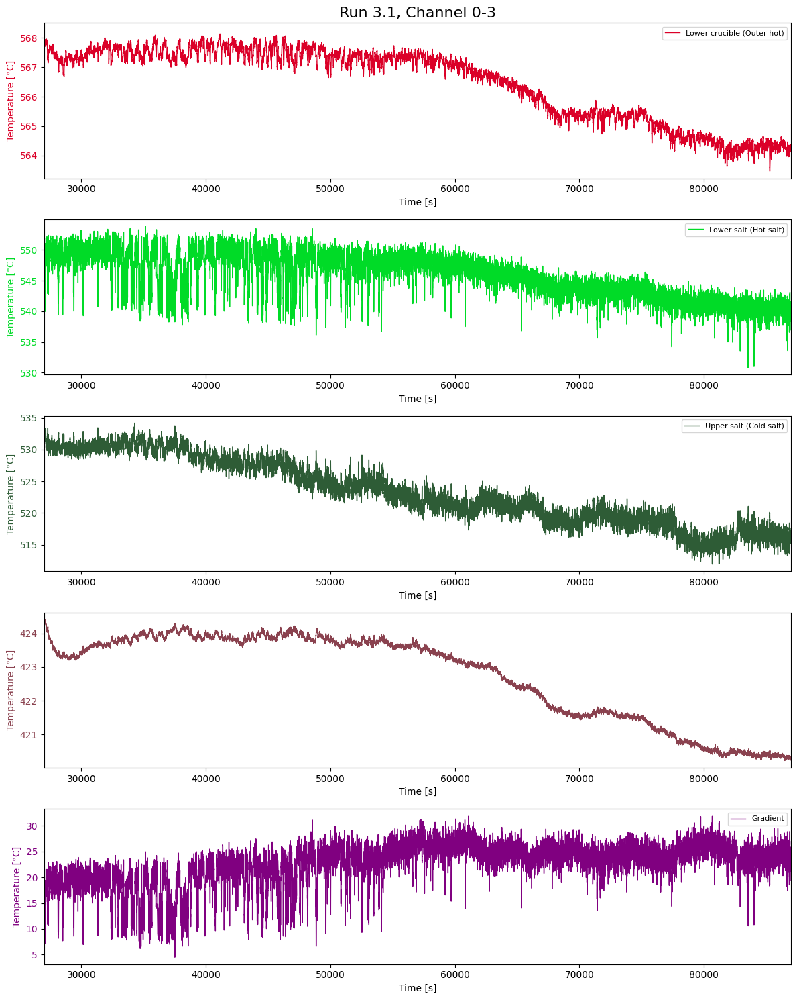

In [ ]:
#Zoom on Run 3.1: Ch0-3 and Gradient.
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(12, 15))

# Plot different things in each row using the SAME function
channelPlotter([CH3run3_1], [timerun3_1], None, 
               [colors[3]], [27000, 87000], None, labels=[labels[3]], linestyles=["-"], ax=ax1)

channelPlotter([CH1run3_1], [timerun3_1], None, 
               [colors[1]], [27000, 87000], None, labels=[labels[1]], linestyles=["-"], ax=ax2)

channelPlotter([CH0run3_1], [timerun3_1], None, 
               [colors[0]], [27000, 87000], None, labels=[labels[0]], linestyles=["-"], ax=ax3)


channelPlotter([CH2run3_1], [timerun3_1], None, 
               [colors[2]], [27000, 87000], None, labels=None, linestyles=["-"], ax=ax4)

channelPlotter([CH1run3_1-CH0run3_1], [timerun3_1], None, 
               ["purple"], [27000, 87000], None, labels=["Gradient"], linestyles=["-"], ax=ax5)

ax1.set_title("Run 3.1, Channel 0-3", fontsize=16)

plt.tight_layout()
plt.show()

# Savintsky-Golay Smoothening and Derivative of individual channels
We here select a window to smooth and take the derivative of.


In [ ]:
# Analys Run 3.1 Preparation

# Parameters and data shortening to range
window_ch0 = 2000
window_ch1 = 2000
window_ch2 = 2000
window_ch3 = 2000
window_grad = window_ch0
poly_ch0 = 3
poly_ch1 = 3
poly_ch2 = 3
poly_ch3 = 3
poly_grad = poly_ch0

window_ch0_2 = 100
window_ch1_2 = 100
window_ch2_2 = 100
window_ch3_2 = 100
window_grad_2 = window_ch0_2
poly_ch0_2 = 3
poly_ch1_2 = 3
poly_ch2_2 = 3
poly_ch3_2 = 3
poly_grad_2 = poly_ch0_2



xmin = 55000
xmax = timerun3_1[-1]

xmin_2 = 0
xmax_2 = timerun3_2[-1]

# Run 3.1
## Channel 0
CH0_timeR, CH0_yR = rangeSelector(CH0run3_1, timerun3_1, [xmin, xmax])
## Channel 1 
CH1_timeR, CH1_yR = rangeSelector(CH1run3_1, timerun3_1, [xmin, xmax])
## Channel 2
CH2_timeR, CH2_yR = rangeSelector(CH2run3_1, timerun3_1, [xmin, xmax])
## Channel 3
CH3_timeR, CH3_yR = rangeSelector(CH3run3_1, timerun3_1, [xmin, xmax])
## Gradient
gradrun3_timeR, gradrun3_yR = rangeSelector(CH1run3_1-CH0run3_1, timerun3_1, [xmin, xmax])

## Channel 0
CH0_timeR_2, CH0_yR_2 = rangeSelector(CH0run3_2, timerun3_2, [xmin_2, xmax_2])
## Channel 1 
CH1_timeR_2, CH1_yR_2 = rangeSelector(CH1run3_2, timerun3_2, [xmin_2, xmax_2])
## Channel 2
CH2_timeR_2, CH2_yR_2 = rangeSelector(CH2run3_2, timerun3_2, [xmin_2, xmax_2])
## Channel 3
CH3_timeR_2, CH3_yR_2 = rangeSelector(CH3run3_2, timerun3_2, [xmin_2, xmax_2])
## Gradient
gradrun3_timeR_2, gradrun3_yR_2 = rangeSelector(CH1run3_2-CH0run3_2, timerun3_2, [xmin_2, xmax_2])

# Savgol calculation
CH0run3_1_f, CH0run3_1_d, CH0run3_1_fd = savgolCompilator(CH0_yR, window_ch0, poly_ch0, deriv=1, deriv_filtered=True)
CH1run3_1_f, CH1run3_1_d, CH1run3_1_fd = savgolCompilator(CH1_yR, window_ch1, poly_ch1, deriv=1, deriv_filtered=True)
CH2run3_1_f, CH2run3_1_d, CH2run3_1_fd = savgolCompilator(CH2_yR, window_ch2, poly_ch2, deriv=1, deriv_filtered=True)
CH3run3_1_f, CH3run3_1_d, CH3run3_1_fd = savgolCompilator(CH3_yR, window_ch3, poly_ch3, deriv=1, deriv_filtered=True)
gradrun3_1_f, gradrun3_1_d, gradrun3_1_fd = savgolCompilator(gradrun3_yR, window_grad, poly_grad, deriv=1, deriv_filtered=True)

# Savgol calculation # Run 3.2
CH0run3_2_f, CH0run3_2_d, CH0run3_2_fd = savgolCompilator(CH0_yR_2, window_ch0_2, poly_ch0_2, deriv=1, deriv_filtered=True)
CH1run3_2_f, CH1run3_2_d, CH1run3_2_fd = savgolCompilator(CH1_yR_2, window_ch1_2, poly_ch1_2, deriv=1, deriv_filtered=True)
CH2run3_2_f, CH2run3_2_d, CH2run3_2_fd = savgolCompilator(CH2_yR_2, window_ch2_2, poly_ch2_2, deriv=1, deriv_filtered=True)
CH3run3_2_f, CH3run3_2_d, CH3run3_2_fd = savgolCompilator(CH3_yR_2, window_ch3_2, poly_ch3_2, deriv=1, deriv_filtered=True)
gradrun3_2_f, gradrun3_2_d, gradrun3_2_fd = savgolCompilator(gradrun3_yR_2, window_grad_2, poly_grad_2, deriv=1, deriv_filtered=True)



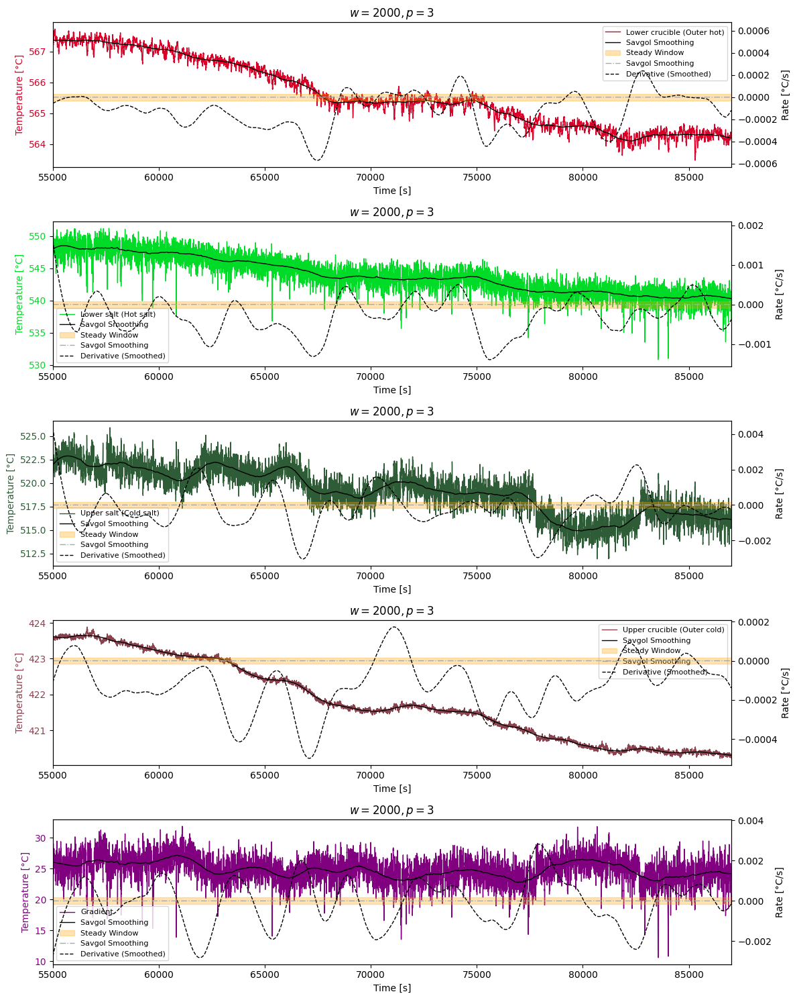

In [ ]:
#Zoom on Run 3.1: Ch0-3 and Gradient.
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(12, 15))

# Plot different things in each row using the SAME function
channelPlotter([CH3run3_1, CH3run3_1_f, np.zeros_like(CH3_timeR), CH3run3_1_fd], [timerun3_1, CH3_timeR, CH3_timeR, CH3_timeR], f"$w = {window_ch3}, p = {poly_ch3}$", 
               [colors[3],"black", "darkgrey", "black",], [xmin, 87000], None, labels=[labels[3], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"],
               linestyles=["-", "-", "-.", "--"], ax=ax1, twin=True, extratwin=True, epsilon=0.05 * (max(CH3run3_1_fd)-min(CH3run3_1_fd))/2)

channelPlotter([CH1run3_1, CH1run3_1_f, np.zeros_like(CH3_timeR), CH1run3_1_fd], [timerun3_1, CH1_timeR, CH1_timeR, CH1_timeR], f"$w = {window_ch1}, p = {poly_ch1}$", 
               [colors[1],"black", "darkgrey", "black",], [xmin, 87000], None, labels=[labels[1], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax2, twin=True, extratwin=True, epsilon=0.05 * (max(CH1run3_1_fd)-min(CH1run3_1_fd))/2)

channelPlotter([CH0run3_1, CH0run3_1_f, np.zeros_like(CH3_timeR), CH0run3_1_fd], [timerun3_1, CH0_timeR, CH0_timeR, CH0_timeR], f"$w = {window_ch0}, p = {poly_ch0}$", 
               [colors[0],"black", "darkgrey", "black",], [xmin, 87000], None, labels=[labels[0], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax3, twin=True, extratwin=True, epsilon=0.05 * (max(CH0run3_1_fd)-min(CH0run3_1_fd))/2)


channelPlotter([CH2run3_1, CH2run3_1_f, np.zeros_like(CH3_timeR), CH2run3_1_fd], [timerun3_1, CH2_timeR, CH2_timeR, CH2_timeR], f"$w = {window_ch2}, p = {poly_ch2}$", 
               [colors[2],"black", "darkgrey", "black",], [xmin, 87000], None, labels=[labels[2], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax4, twin=True, extratwin=True, epsilon=0.05 * (max(CH2run3_1_fd)-min(CH2run3_1_fd))/2)

channelPlotter([CH1run3_1-CH0run3_1, gradrun3_1_f, np.zeros_like(CH3_timeR), gradrun3_1_fd], [timerun3_1, gradrun3_timeR, gradrun3_timeR, gradrun3_timeR], f"$w = {window_grad}, p = {poly_grad}$", 
               ["purple", "black", "darkgrey", "black",], [xmin, 87000], None, labels=["Gradient", "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax5, twin=True, extratwin=True, epsilon=0.05 * (max(gradrun3_1_fd)-min(gradrun3_1_fd))/2)
#ax1.set_title("Run 3.1, Channel 0-3", fontsize=16)


plt.tight_layout()
plt.show()


In [ ]:
print(np.mean(CH0run3_1_fd))
print(np.mean(CH1run3_1_fd))
print(np.mean(CH2run3_1_fd))
print(np.mean(CH3run3_1_fd))
print(np.mean(gradrun3_1_fd))

-0.00023407591302400076
-0.0002666954900550258
-0.00012924863339462776
-0.00011096011605629186
-3.261957703100892e-05


# Coherence of Selected Channels (Run 3)

The window code, that splits the data is governed by the following relationships between the window size (w), step size (s) and nperseg.
The amount of windows is given by the ratio of data points minus the window size and divided by the step size. 


$$N_w = \frac{N_{data} - w}{s}$$

Sampling Rate: 0.83 Hz


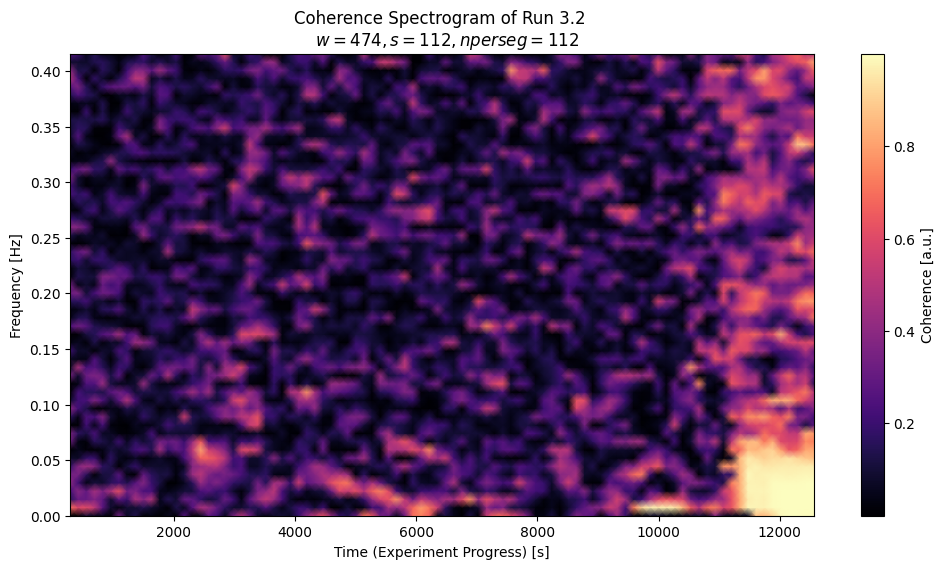

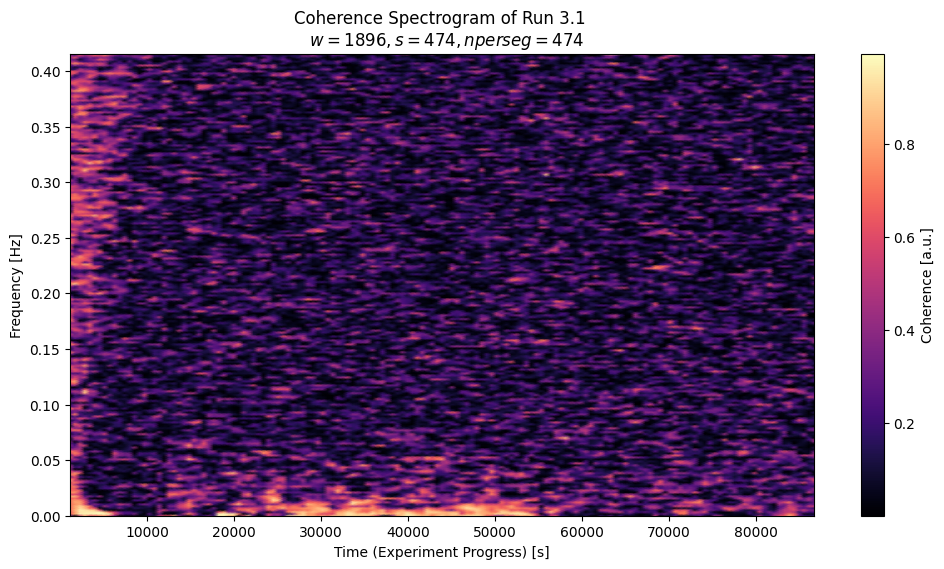

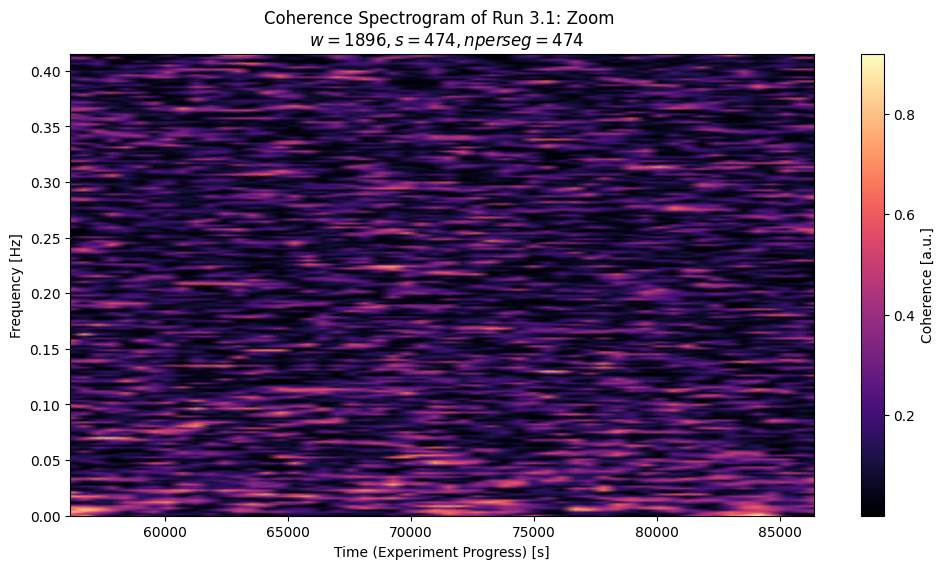

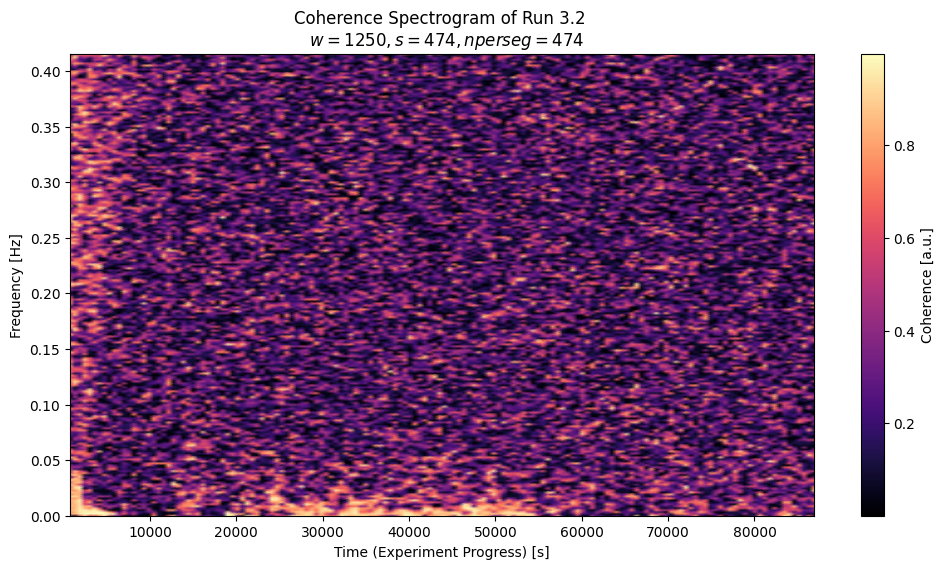

C:\Users\jeanv\OneDrive - Delft University of Technology\Uitwisseling - TUDelft\Courses\MEP\Programming\extra\gradientAnalysis\functions.py:181: RuntimeWarning: divide by zero encountered in power
  return a * np.power(f, b)


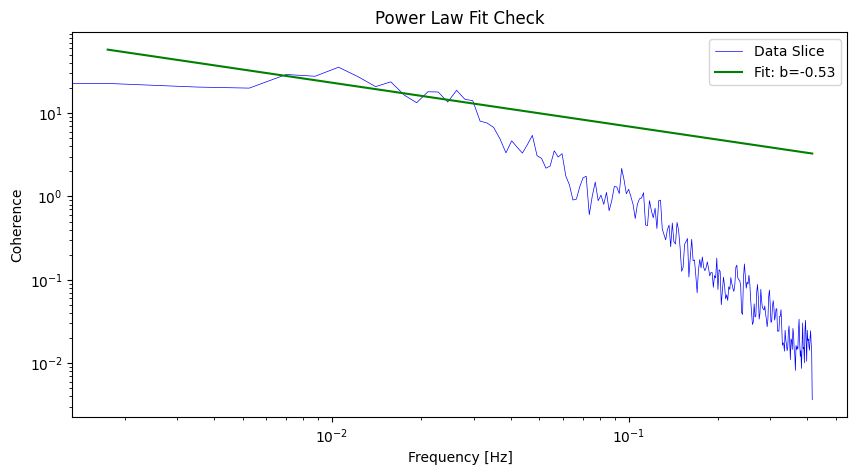

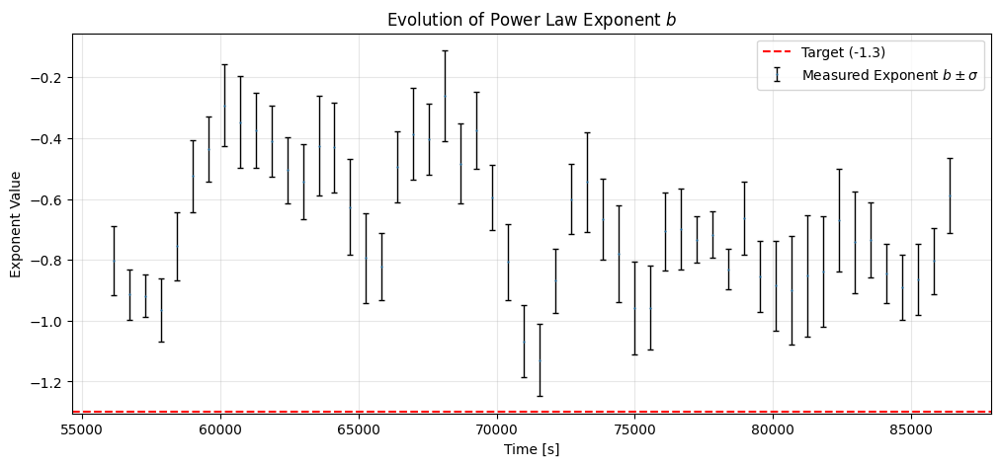

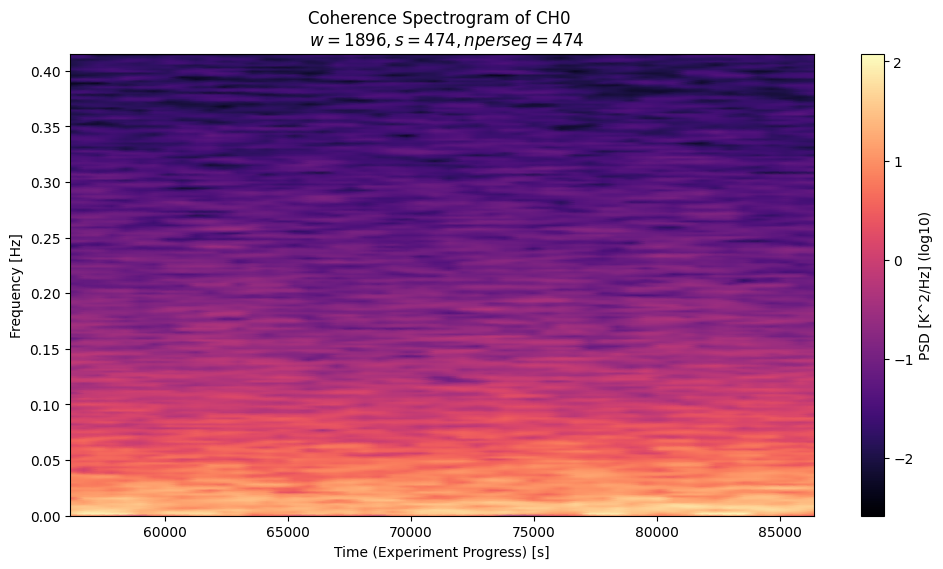

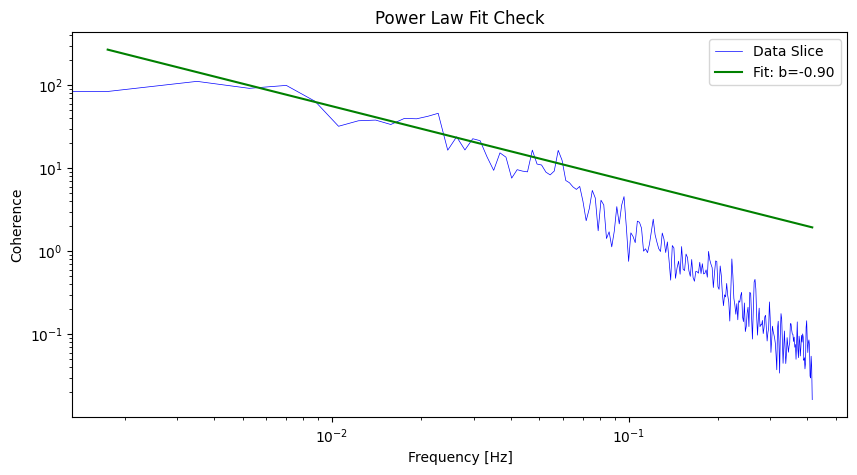

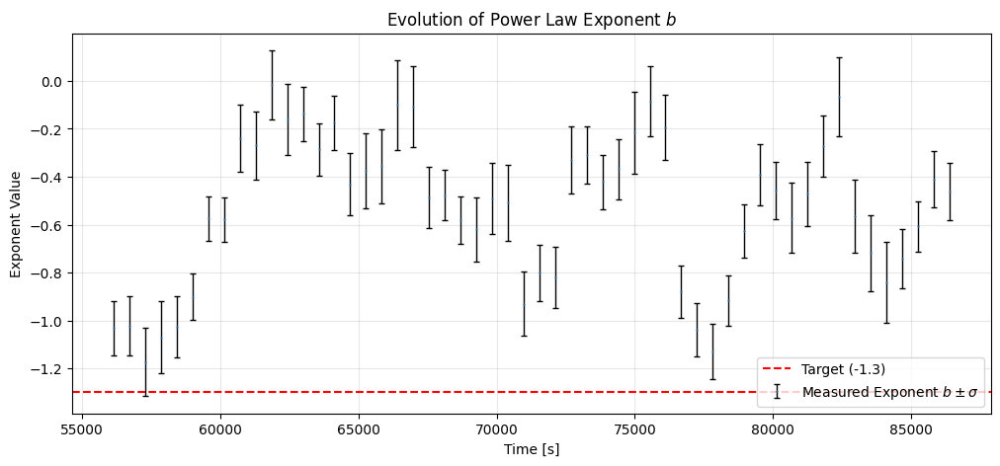

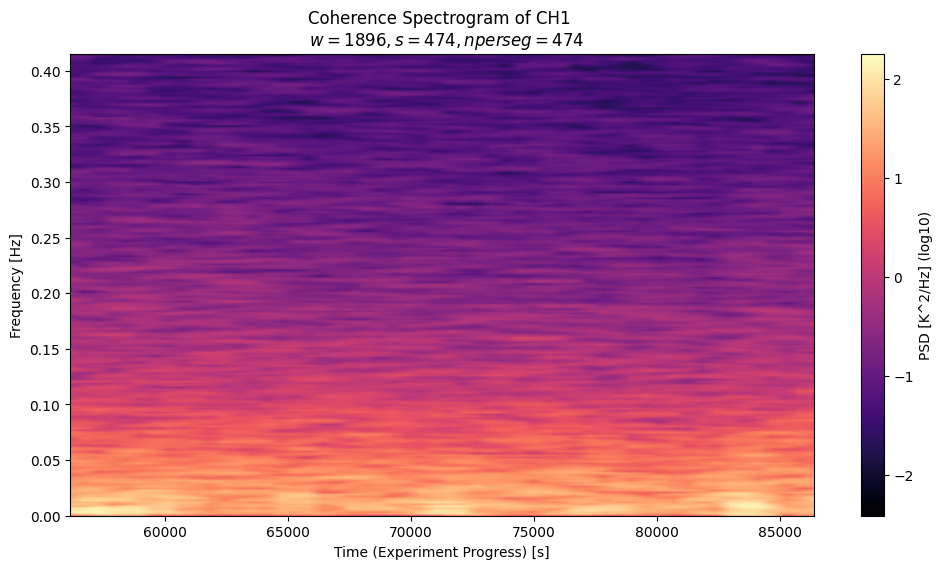

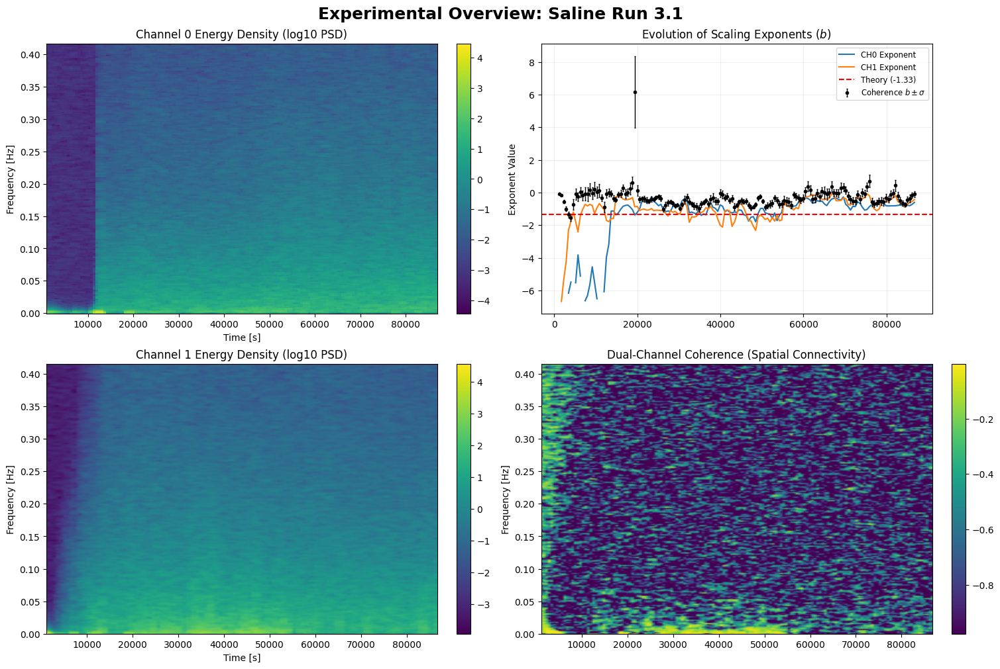

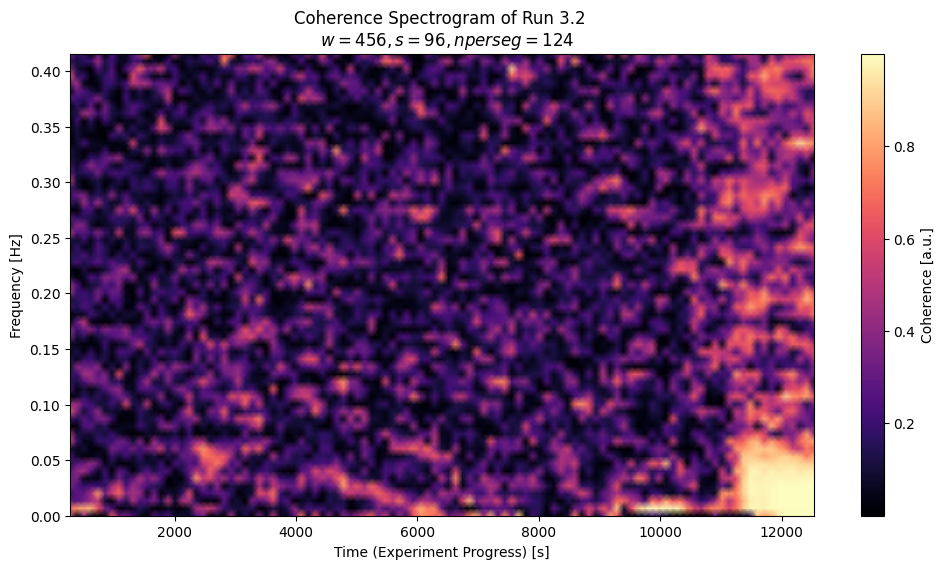

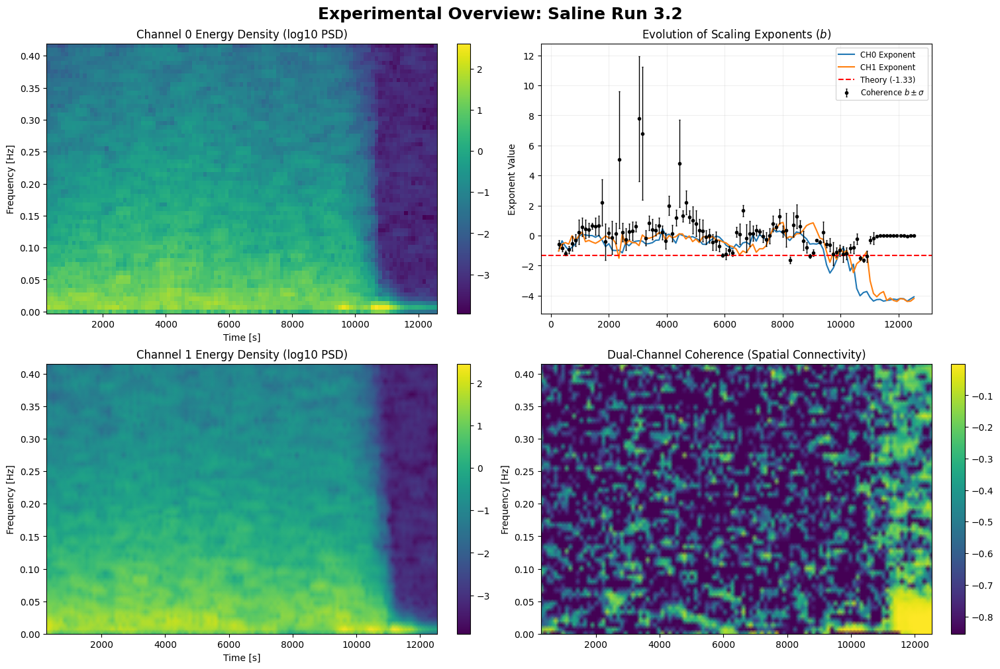

In [ ]:
time_diff = np.mean(np.diff(timerun3_1)) 
fs = 1.0 / time_diff

print(f"Sampling Rate: {fs:.2f} Hz")
# Heatmap of Saline Coherence plots


# PSD Channel 1 Run 2 (Local energy at other sensor)
window_size, step_size, nperseg = 474, 112, 112
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors = coherenceData(CH0run3_2, CH1run3_2, timerun3_2, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])
plotCoherence1 = coherencePlotter(win_t, f, Z, Z_ax, window_size, step_size, nperseg, runID="Run 3.2", cmap="magma")



## Run 3.1: Full range
window_size, step_size, nperseg = 1896, 474, 474
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors = coherenceData(CH0run3_1, CH1run3_1, timerun3_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])
plotCoherence1 = coherencePlotter(win_t, f, Z, Z_ax, window_size, step_size, nperseg, runID="Run 3.1", cmap="magma")


## Run 3.1: Zoom. Xmin based on value given earlier. 
window_size, step_size, nperseg = 1896, 474, 474
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors = coherenceData(CH0_yR, CH1_yR, CH0_timeR, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])
plotCoherence1 = coherencePlotter(win_t, f, Z, Z_ax, window_size, step_size, nperseg, runID="Run 3.1: Zoom", cmap="magma")

# ## Run 3.1
window_size, step_size, nperseg =  1250, 474, 474
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors = coherenceData(CH1run3_1, CH0run3_1, timerun3_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])
plotCoherence1 = coherencePlotter(win_t, f, Z, Z_ax, window_size, step_size, nperseg, runID="Run 3.2", cmap="magma")

# Fitting plots of each window with power law

window_size, step_size, nperseg =  1896, 474, 474
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors  = singleWelch(CH0_yR, CH0_timeR, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=True, freq_range=[0.005,0.04], dtrend=True)
coherenceFitPlotter(f, Z[:, 5], a_arr[5], b_arr[5], windows_time=win_t, b_fits_array=b_arr, b_errors=b_errors)
coherencePlotter(win_t, f, Z_log, Z_ax, window_size, step_size, nperseg, runID="CH0", cmap="magma")

window_size, step_size, nperseg =  1896, 474, 474
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors  = singleWelch(CH1_yR, CH1_timeR, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=True, freq_range=[0.005,0.04], dtrend=True)
coherenceFitPlotter(f, Z[:, 5], a_arr[5], b_arr[5], windows_time=win_t, b_fits_array=b_arr, b_errors=b_errors)
coherencePlotter(win_t, f, Z_log, Z_ax, window_size, step_size, nperseg, runID="CH1", cmap="magma")


# --- 1. Gather all the pieces ---
# Coherence (Relationship between 0 and 1)
window_size, step_size, nperseg =  1896, 474, 474
win_t, f, Z_coh, _, _, a_coh, b_coh, b_err_coh = coherenceData(CH0run3_1, CH1run3_1, timerun3_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])

# PSD Channel 0 (Local energy at bottom/top)
window_size, step_size, nperseg =   1896, 474, 474
_, _, Z_psd0, _, _, a_psd0, b_psd0, b_err_psd0 = singleWelch(CH0run3_1, timerun3_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# # PSD Channel 1 (Local energy at other sensor)
window_size, step_size, nperseg =   1896, 474, 474
_, _, Z_psd1, _, _, a_psd1, b_psd1, b_err_psd1 = singleWelch(CH1run3_1, timerun3_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# --- Call the function ---
plotOverviewDashboard("Saline Run 3.1", f, win_t, Z_coh, Z_psd0, Z_psd1, b_coh, b_psd0, b_psd1, a_coh, b_errors=b_err_coh)


## Run 3.2

window_size, step_size, nperseg =  456, 96, 124
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors = coherenceData(CH1run3_2, CH0run3_2, timerun3_2, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])
plotCoherence1 = coherencePlotter(win_t, f, Z, Z_ax, window_size, step_size, nperseg, runID="Run 3.2", cmap="magma")

# --- 1. Gather all the pieces ---
# Coherence (Relationship between 0 and 1)
window_size, step_size, nperseg =  456, 96, 124
win_t, f, Z_coh, _, _, a_coh, b_coh, b_err_coh = coherenceData(CH0run3_2, CH1run3_2, timerun3_2, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])

# PSD Channel 0 (Local energy at bottom/top)
window_size, step_size, nperseg =   456, 96, 124
_, _, Z_psd0, _, _, a_psd0, b_psd0, b_err_psd0 = singleWelch(CH0run3_2, timerun3_2, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# # PSD Channel 1 (Local energy at other sensor)
window_size, step_size, nperseg =   456, 96, 124
_, _, Z_psd1, _, _, a_psd1, b_psd1, b_err_psd1 = singleWelch(CH1run3_2, timerun3_2, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# --- Call the function ---
plotOverviewDashboard("Saline Run 3.2", f, win_t, Z_coh, Z_psd0, Z_psd1, b_coh, b_psd0, b_psd1, a_coh, b_errors=b_err_coh)




# Run 2

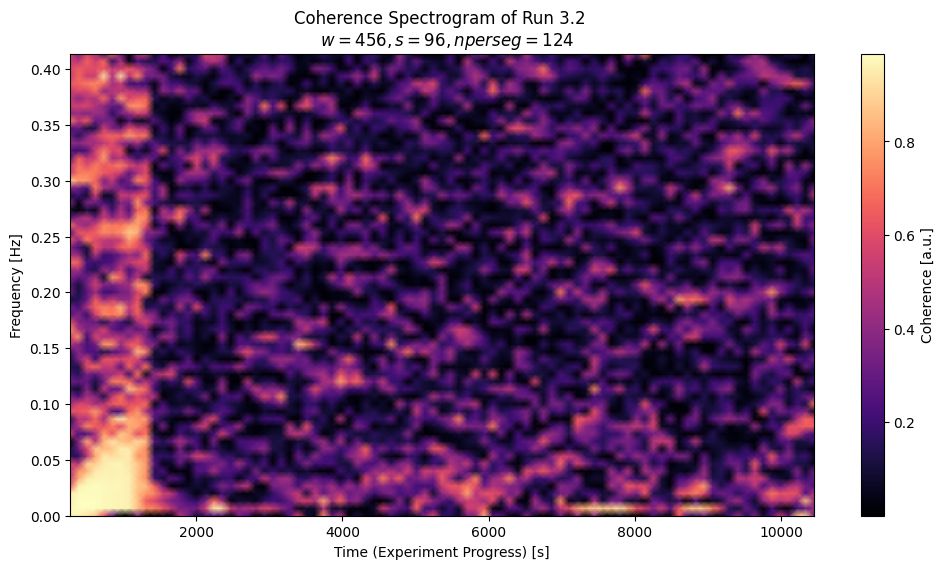

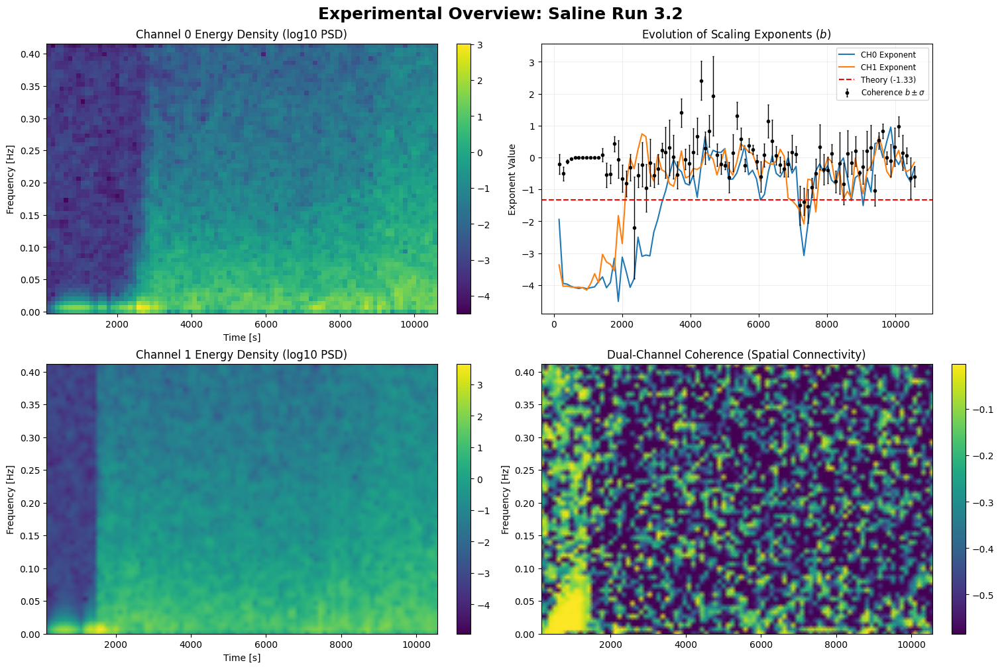

In [ ]:

## Run 3.2

window_size, step_size, nperseg =   456, 96, 124
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors = coherenceData(CH1run2_1, CH0run2_1, timerun2_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])
plotCoherence1 = coherencePlotter(win_t, f, Z, Z_ax, window_size, step_size, nperseg, runID="Run 3.2", cmap="magma")

# --- 1. Gather all the pieces ---
# Coherence (Relationship between 0 and 1)
window_size, step_size, nperseg =   256, 96, 124
win_t, f, Z_coh, _, _, a_coh, b_coh, b_err_coh = coherenceData(CH0run2_1, CH1run2_1, timerun2_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])

# PSD Channel 0 (Local energy at bottom/top)
window_size, step_size, nperseg =    256, 96, 124
_, _, Z_psd0, _, _, a_psd0, b_psd0, b_err_psd0 = singleWelch(CH0run2_1, timerun2_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# # PSD Channel 1 (Local energy at other sensor)
window_size, step_size, nperseg =    256, 96, 124
_, _, Z_psd1, _, _, a_psd1, b_psd1, b_err_psd1 = singleWelch(CH1run2_1, timerun2_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# --- Call the function ---
plotOverviewDashboard("Saline Run 3.2", f, win_t, Z_coh, Z_psd0, Z_psd1, b_coh, b_psd0, b_psd1, a_coh, b_errors=b_err_coh)




c:\Users\jeanv\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\jeanv\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\_core\_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


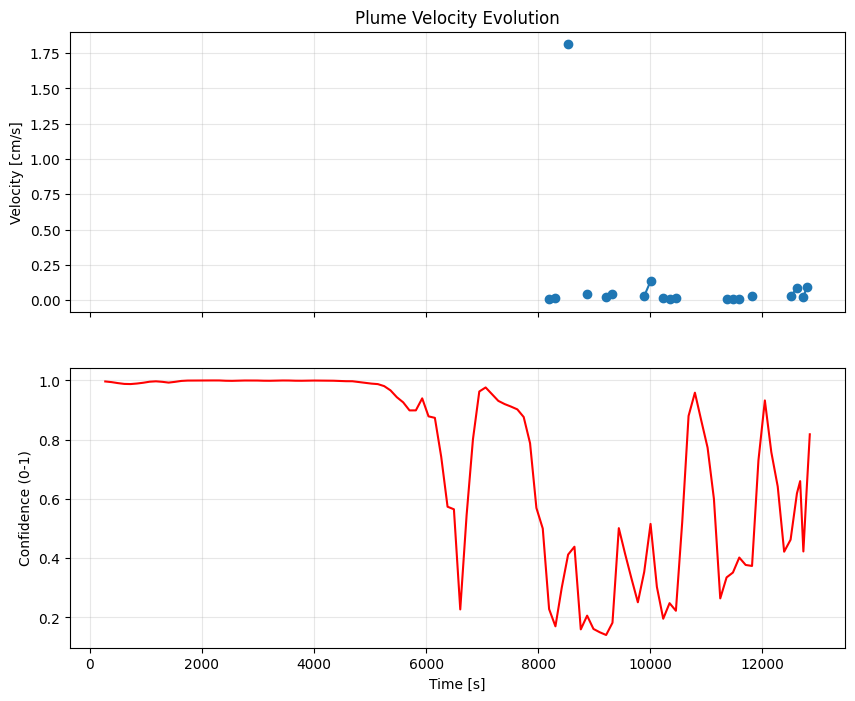

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 2. Setup Parameters
dt = np.mean(np.diff(timerun3_1))
fs = 1.0 / dt
distance_z = 0.0436  # Distance between sensors in meters (e.g., 5cm)

# Matching the windowing from your spectral analysis for consistency
window_pts = 456   # Total points in a slice
step_pts = 94      # How much we slide the window

def getPlumeVelocity(sig_a, sig_b, fs, dz):
    """Calculates velocity based on cross-correlation peak."""
    # Standardize signals (mean=0, std=1) to focus on 'wiggles'
    sa = (sig_a - np.mean(sig_a)) / (np.std(sig_a) + 1e-6)
    sb = (sig_b - np.mean(sig_b)) / (np.std(sig_b) + 1e-6)
    
    # Compute cross-correlation
    corr = np.correlate(sb, sa, mode='full')
    lags = np.arange(-len(sa) + 1, len(sa))
    
    # Find the time delay (lag) with the highest correlation
    idx = np.argmax(corr)
    max_corr_value = corr[idx] / len(sa)  # Peak strength (0 to 1)
    time_delay = lags[idx] / fs           # Seconds
    
    # Physics check: Plumes must rise (positive delay)
    if time_delay > 0:
        velocity = dz / time_delay
    else:
        velocity = np.nan
        
    return velocity, time_delay, max_corr_value

# 3. Sliding Window Loop
results = []
for start in range(0, len(CH0run3_1) - window_pts, step_pts):
    end = start + window_pts
    v, delay, conf = getPlumeVelocity(CH0run3_1[start:end], CH1run3_1[start:end], fs, distance_z)
    results.append([np.mean(timerun3_2[start:end]), v, conf])

res_arr = np.array(results)
t_vec, v_vec, c_vec = res_arr[:,0], res_arr[:,1], res_arr[:,2]

# 4. Plotting
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
ax1.plot(t_vec, v_vec * 100, 'o-', label='Velocity [cm/s]')
ax1.set_ylabel("Velocity [cm/s]")
ax1.set_title("Plume Velocity Evolution")
ax1.grid(True, alpha=0.3)

ax2.plot(t_vec, c_vec, 'r-', label='Correlation Confidence')
ax2.set_ylabel("Confidence (0-1)")
ax2.set_xlabel("Time [s]")
ax2.grid(True, alpha=0.3)
plt.show()

# Coherence Plots: Assembly of Run 3.1 and 3.2

<>:101: SyntaxWarning: invalid escape sequence '\p'
<>:101: SyntaxWarning: invalid escape sequence '\p'
C:\Users\jeanv\AppData\Local\Temp\ipykernel_21476\3684533092.py:101: SyntaxWarning: invalid escape sequence '\p'
  label='Measured Exponent $b \pm \sigma$')


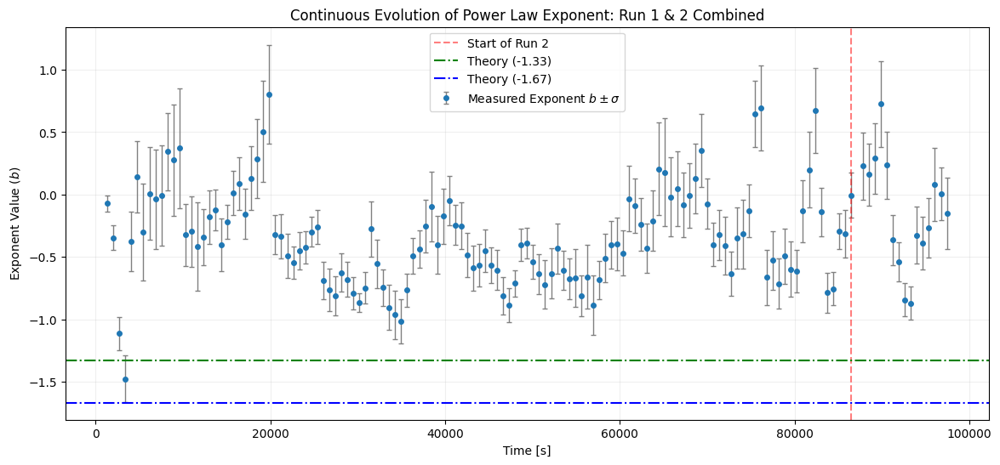

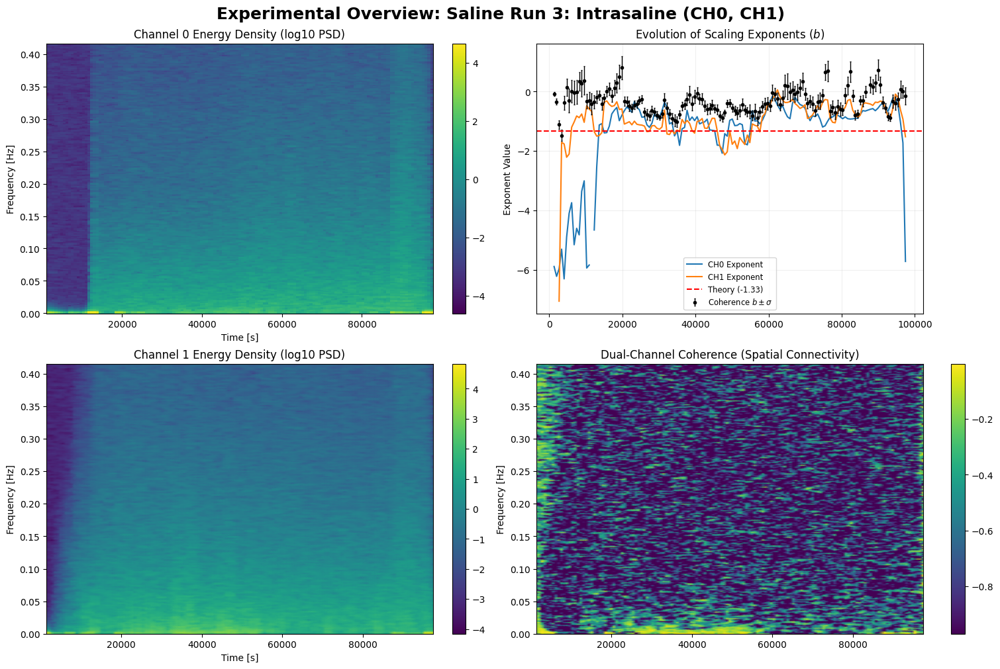

In [ ]:
## Run 3:1


# Coherence 
window_sizecoh1, step_sizecoh1, npersegcoh1 =   2280, 570, 570
win_tcoh1, fcoh1, Z_cohcoh1, _, _, a_cohcoh1, b_cohcoh1, b_err_cohcoh1 = coherenceData(CH0run3_1, CH1run3_1, timerun3_1, window_size=window_sizecoh1, step_size=step_sizecoh1, nperseg=npersegcoh1, logaxis=False, freq_range=[0.005,0.04])


# CH0
window_size031, step_size031, nperseg031 =  2048, 570, 570
_, _, Z_psd031, _, _, a_psd031, b_psd031, b_err_psd031 = singleWelch(CH0run3_1, timerun3_1, window_size=window_size031, step_size=step_size031, nperseg=nperseg031, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

## CH1
window_size131, step_size131, nperseg131 =  2280, 570, 570
_, _, Z_psd131, _, _, a_psd131, b_psd131, b_err_psd131 = singleWelch(CH1run3_1, timerun3_1, window_size=window_size131, step_size=step_size131, nperseg=nperseg131, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Run 3.2

# Coherence 
window_sizecoh2, step_sizecoh2, npersegcoh2 =  2280, 570, 570
win_tcoh2, fcoh2, Z_cohcoh2, _, _, a_cohcoh2, b_cohcoh2, b_err_cohcoh2 = coherenceData(CH0run3_2, CH1run3_2, timerun3_2, window_size=window_sizecoh2, step_size=step_sizecoh2, nperseg=npersegcoh2, logaxis=False, freq_range=[0.005,0.04])

# CH0
window_size032, step_size032, nperseg032 =   2280, 570, 570
_, _, Z_psd032, _, _, a_psd032, b_psd032, b_err_psd032 = singleWelch(CH0run3_2, timerun3_2, window_size=window_size032, step_size=step_size032, nperseg=nperseg032, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# # CH1
window_size132, step_size132, nperseg132 =   2280, 570, 570
_, _, Z_psd132, _, _, a_psd132, b_psd132, b_err_psd132 = singleWelch(CH1run3_2, timerun3_2, window_size=window_size132, step_size=step_size132, nperseg=nperseg132, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Assembled

if not np.allclose(fcoh1, fcoh2):
    print("Warning: Frequencies do not match exactly. Heatmaps may not align!")
    # Use fcoh1 as the master frequency
    f_total = fcoh1
else:
    f_total = fcoh1
# --- 2. Concatenate 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Stack 2D Matrices (Heatmaps) ---
# np.hstack adds the new columns (time windows) to the right of the first matrix
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# Z_psd0tot = np.concatenate([Z_psd031, Z_psd032])
# a_psd0tot = np.concatenate([a_psd031, a_psd032])
# b_psd0tot = np.concatenate([b_psd031, b_psd032])
# b_err_psd0tot = np.concatenate([b_err_psd031, b_err_psd032])

# # --- 3. Stack 2D Matrices (Heatmaps) ---
# # np.hstack adds the new columns (time windows) to the right of the first matrix


# Z_psd1tot = np.concatenate([Z_psd131, Z_psd132])
# a_psd1tot = np.concatenate([a_psd131, a_psd132])
# b_psd1tot = np.concatenate([b_psd131, b_psd132])
# b_err_psd1tot = np.concatenate([b_err_psd131, b_err_psd132])

import numpy as np

# --- 1. Handle Time Offset ---
# Calculate the end of the first run
t_end_run1 = win_tcoh1[-1] 
# Shift run 2 so it starts right after run 1
win_tcoh2_shifted = win_tcoh2 + t_end_run1

# --- 2. Merge 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2_shifted])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Merge 2D Matrices (The Heatmaps) ---
# We use hstack (horizontal stack) to add columns for the new time windows
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# --- 4. Merge PSD variables if you have them for the dashboard ---
# (Repeat the same logic for Z_psd0, Z_psd1, b_psd0, b_psd1)
Z_psd0_total = np.hstack([Z_psd031, Z_psd032])
Z_psd1_total = np.hstack([Z_psd131, Z_psd132])
b_psd0_total = np.concatenate([b_psd031, b_psd032])
b_psd1_total = np.concatenate([b_psd131, b_psd132])

# --- 5. Frequency ---
# We assume the frequency bins are the same for both runs
f_total = fcoh1


# 3. Combined Saline Channles Run 3
plt.figure(figsize=(14, 6))

# Plot the combined data
plt.errorbar(win_t_total, b_coh_total, yerr=b_err_total, fmt='o', 
             ecolor='gray', elinewidth=1, capsize=2, ms=4, 
             label='Measured Exponent $b \pm \sigma$')

# Add a vertical line to show where Run 2 starts
plt.axvline(x=win_tcoh1[-1], color='red', linestyle='--', alpha=0.5, label='Start of Run 2')

# Add theoretical reference lines
plt.axhline(-1.33, color='green', ls='-.', label='Theory (-1.33)')
plt.axhline(-1.67, color='blue', ls='-.', label='Theory (-1.67)')

plt.xlabel("Time [s]")
plt.ylabel("Exponent Value ($b$)")
plt.title("Continuous Evolution of Power Law Exponent: Run 1 & 2 Combined")
plt.legend()
plt.grid(True, alpha=0.2)
plt.show()

plotOverviewDashboard("Saline Run 3: Intrasaline (CH0, CH1)", f_total, win_t_total, Z_coh_total, Z_psd0_total, Z_psd1_total, b_coh_total, b_psd0_total, b_psd1_total, a_coh_total, b_errors=b_err_total, cmap="viridis")



<>:101: SyntaxWarning: invalid escape sequence '\p'
<>:101: SyntaxWarning: invalid escape sequence '\p'
C:\Users\jeanv\AppData\Local\Temp\ipykernel_21476\2778032366.py:101: SyntaxWarning: invalid escape sequence '\p'
  label='Measured Exponent $b \pm \sigma$')


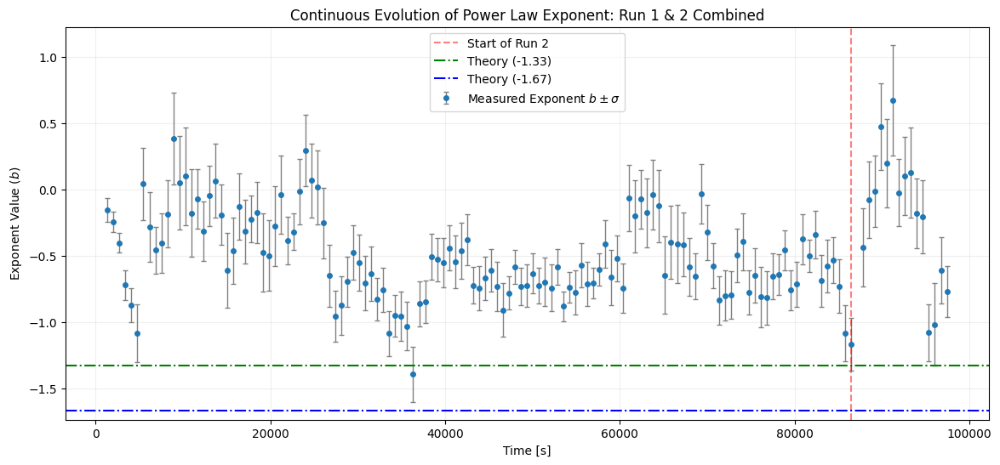

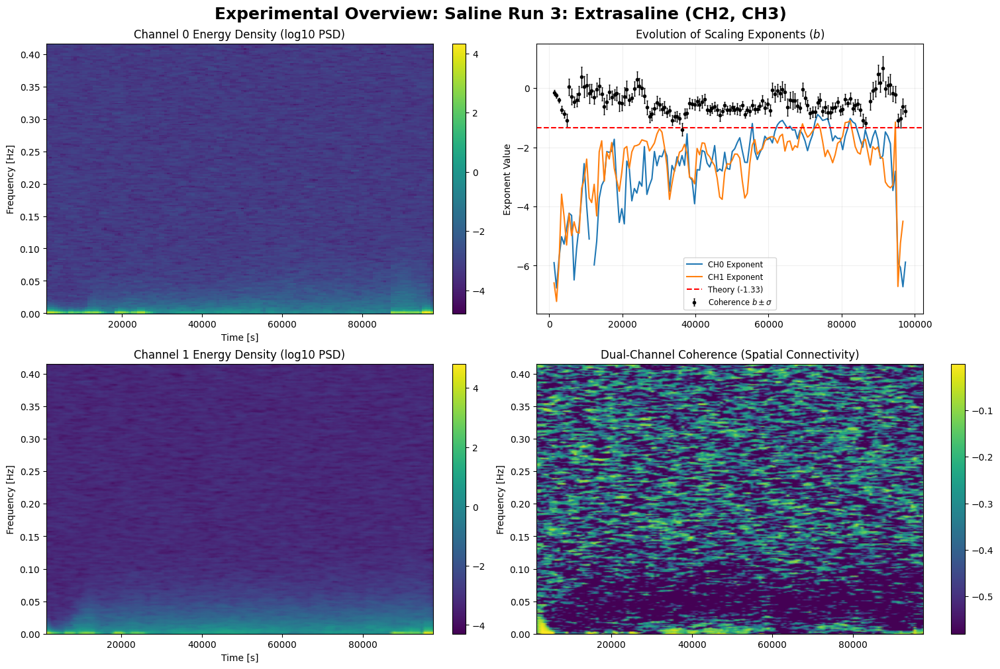

In [ ]:
## Run 3:1


# Coherence 
window_sizecoh1, step_sizecoh1, npersegcoh1 =   2280, 570, 570
win_tcoh1, fcoh1, Z_cohcoh1, _, _, a_cohcoh1, b_cohcoh1, b_err_cohcoh1 = coherenceData(CH2run3_1, CH3run3_1, timerun3_1, window_size=window_sizecoh1, step_size=step_sizecoh1, nperseg=npersegcoh1, logaxis=True, freq_range=[0.005,0.04])


# CH0
window_size031, step_size031, nperseg031 =  2048, 570, 570
_, _, Z_psd031, _, _, a_psd031, b_psd031, b_err_psd031 = singleWelch(CH2run3_1, timerun3_1, window_size=window_size031, step_size=step_size031, nperseg=nperseg031, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

## CH1
window_size131, step_size131, nperseg131 =  2280, 570, 570
_, _, Z_psd131, _, _, a_psd131, b_psd131, b_err_psd131 = singleWelch(CH3run3_1, timerun3_1, window_size=window_size131, step_size=step_size131, nperseg=nperseg131, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Run 3.2

# Coherence 
window_sizecoh2, step_sizecoh2, npersegcoh2 =  2280, 570, 570
win_tcoh2, fcoh2, Z_cohcoh2, _, _, a_cohcoh2, b_cohcoh2, b_err_cohcoh2 = coherenceData(CH2run3_2, CH3run3_2, timerun3_2, window_size=window_sizecoh2, step_size=step_sizecoh2, nperseg=npersegcoh2, logaxis=True, freq_range=[0.005,0.04])

# CH0
window_size032, step_size032, nperseg032 =   2280, 570, 570
_, _, Z_psd032, _, _, a_psd032, b_psd032, b_err_psd032 = singleWelch(CH2run3_2, timerun3_2, window_size=window_size032, step_size=step_size032, nperseg=nperseg032, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# # CH1
window_size132, step_size132, nperseg132 =   2280, 570, 570
_, _, Z_psd132, _, _, a_psd132, b_psd132, b_err_psd132 = singleWelch(CH3run3_2, timerun3_2, window_size=window_size132, step_size=step_size132, nperseg=nperseg132, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Assembled

if not np.allclose(fcoh1, fcoh2):
    print("Warning: Frequencies do not match exactly. Heatmaps may not align!")
    # Use fcoh1 as the master frequency
    f_total = fcoh1
else:
    f_total = fcoh1
# --- 2. Concatenate 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Stack 2D Matrices (Heatmaps) ---
# np.hstack adds the new columns (time windows) to the right of the first matrix
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# Z_psd0tot = np.concatenate([Z_psd031, Z_psd032])
# a_psd0tot = np.concatenate([a_psd031, a_psd032])
# b_psd0tot = np.concatenate([b_psd031, b_psd032])
# b_err_psd0tot = np.concatenate([b_err_psd031, b_err_psd032])

# # --- 3. Stack 2D Matrices (Heatmaps) ---
# # np.hstack adds the new columns (time windows) to the right of the first matrix


# Z_psd1tot = np.concatenate([Z_psd131, Z_psd132])
# a_psd1tot = np.concatenate([a_psd131, a_psd132])
# b_psd1tot = np.concatenate([b_psd131, b_psd132])
# b_err_psd1tot = np.concatenate([b_err_psd131, b_err_psd132])

import numpy as np

# --- 1. Handle Time Offset ---
# Calculate the end of the first run
t_end_run1 = win_tcoh1[-1] 
# Shift run 2 so it starts right after run 1
win_tcoh2_shifted = win_tcoh2 + t_end_run1

# --- 2. Merge 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2_shifted])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Merge 2D Matrices (The Heatmaps) ---
# We use hstack (horizontal stack) to add columns for the new time windows
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# --- 4. Merge PSD variables if you have them for the dashboard ---
# (Repeat the same logic for Z_psd0, Z_psd1, b_psd0, b_psd1)
Z_psd0_total = np.hstack([Z_psd031, Z_psd032])
Z_psd1_total = np.hstack([Z_psd131, Z_psd132])
b_psd0_total = np.concatenate([b_psd031, b_psd032])
b_psd1_total = np.concatenate([b_psd131, b_psd132])

# --- 5. Frequency ---
# We assume the frequency bins are the same for both runs
f_total = fcoh1


# 3. Combined Saline Channles Run 3
plt.figure(figsize=(14, 6))

# Plot the combined data
plt.errorbar(win_t_total, b_coh_total, yerr=b_err_total, fmt='o', 
             ecolor='gray', elinewidth=1, capsize=2, ms=4, 
             label='Measured Exponent $b \pm \sigma$')

# Add a vertical line to show where Run 2 starts
plt.axvline(x=win_tcoh1[-1], color='red', linestyle='--', alpha=0.5, label='Start of Run 2')

# Add theoretical reference lines
plt.axhline(-1.33, color='green', ls='-.', label='Theory (-1.33)')
plt.axhline(-1.67, color='blue', ls='-.', label='Theory (-1.67)')

plt.xlabel("Time [s]")
plt.ylabel("Exponent Value ($b$)")
plt.title("Continuous Evolution of Power Law Exponent: Run 1 & 2 Combined")
plt.legend()
plt.grid(True, alpha=0.2)
plt.show()

plotOverviewDashboard("Saline Run 3: Extrasaline (CH2, CH3)", f_total, win_t_total, Z_coh_total, Z_psd0_total, Z_psd1_total, b_coh_total, b_psd0_total, b_psd1_total, a_coh_total, b_errors=b_err_total, cmap="magma")



# Coherence Plots: Assembly of Run 2.1 and 2.2

<>:105: SyntaxWarning: invalid escape sequence '\p'
<>:105: SyntaxWarning: invalid escape sequence '\p'
C:\Users\jeanv\AppData\Local\Temp\ipykernel_21476\118088041.py:105: SyntaxWarning: invalid escape sequence '\p'
  label='Measured Exponent $b \pm \sigma$')


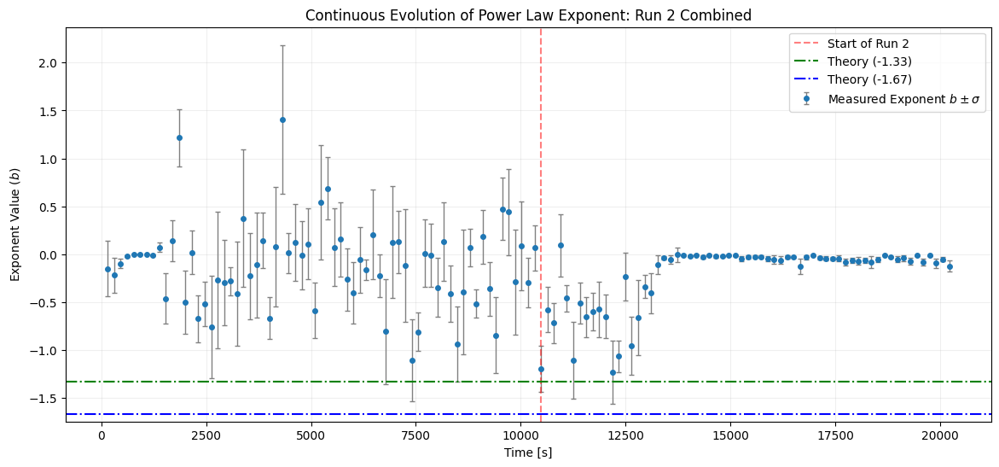

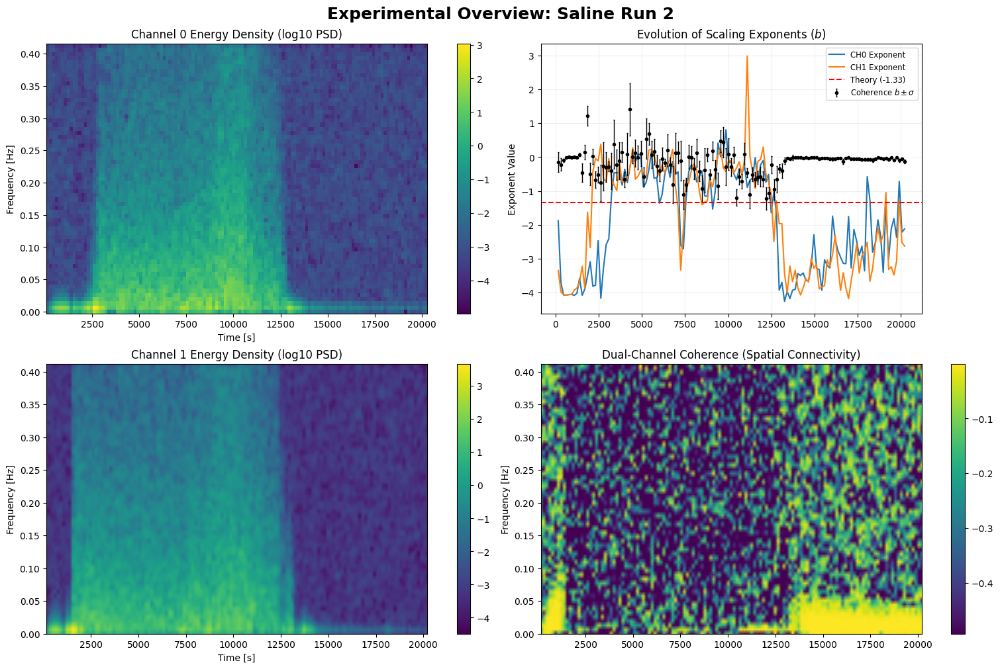

In [ ]:
## Run 2.1


# Coherence 
window_sizecoh1, step_sizecoh1, npersegcoh1 =   256, 128, 128
win_tcoh1, fcoh1, Z_cohcoh1, _, _, a_cohcoh1, b_cohcoh1, b_err_cohcoh1 = coherenceData(CH0run2_1, CH1run2_1, timerun2_1, window_size=window_sizecoh1, step_size=step_sizecoh1, nperseg=npersegcoh1, logaxis=False, freq_range=[0.005,0.04])


# CH0
window_size021, step_size021, nperseg021 =  256, 128, 128
_, _, Z_psd021, _, _, a_psd021, b_psd021, b_err_psd021 = singleWelch(CH0run2_1, timerun2_1, window_size=window_size021, step_size=step_size021, nperseg=nperseg021, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

## CH1
window_size121, step_size121, nperseg121 =  256, 128, 128
_, _, Z_psd121, _, _, a_psd121, b_psd121, b_err_psd121 = singleWelch(CH1run2_1, timerun2_1, window_size=window_size121, step_size=step_size121, nperseg=nperseg121, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Run 2.2


timerun2_R, CH0run2_yR = rangeSelector(CH0run2_2, timerun2_2, [0, 10000])
timerun2_R, CH1run2_yR = rangeSelector(CH1run2_2, timerun2_2, [0, 10000])

# Coherence 
window_sizecoh2, step_sizecoh2, npersegcoh2 =  256, 128, 128
win_tcoh2, fcoh2, Z_cohcoh2, _, _, a_cohcoh2, b_cohcoh2, b_err_cohcoh2 = coherenceData(CH0run2_yR, CH1run2_yR, timerun2_R, window_size=window_sizecoh2, step_size=step_sizecoh2, nperseg=npersegcoh2, logaxis=False, freq_range=[0.005,0.04])

# CH0
window_size022, step_size022, nperseg022 =   256, 128, 128
_, _, Z_psd022, _, _, a_psd022, b_psd022, b_err_psd022 = singleWelch(CH0run2_yR, timerun2_R, window_size=window_size022, step_size=step_size022, nperseg=nperseg022, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# # CH1
window_size122, step_size122, nperseg122 =   256, 128, 128
_, _, Z_psd122, _, _, a_psd122, b_psd122, b_err_psd122 = singleWelch(CH1run2_yR, timerun2_R, window_size=window_size122, step_size=step_size122, nperseg=nperseg122, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Assembled

if not np.allclose(fcoh1, fcoh2):
    print("Warning: Frequencies do not match exactly. Heatmaps may not align!")
    # Use fcoh1 as the master frequency
    f_total = fcoh1
else:
    f_total = fcoh1
# --- 2. Concatenate 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Stack 2D Matrices (Heatmaps) ---
# np.hstack adds the new columns (time windows) to the right of the first matrix
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# Z_psd0tot = np.concatenate([Z_psd031, Z_psd032])
# a_psd0tot = np.concatenate([a_psd031, a_psd032])
# b_psd0tot = np.concatenate([b_psd031, b_psd032])
# b_err_psd0tot = np.concatenate([b_err_psd031, b_err_psd032])

# # --- 3. Stack 2D Matrices (Heatmaps) ---
# # np.hstack adds the new columns (time windows) to the right of the first matrix


# Z_psd1tot = np.concatenate([Z_psd131, Z_psd132])
# a_psd1tot = np.concatenate([a_psd131, a_psd132])
# b_psd1tot = np.concatenate([b_psd131, b_psd132])
# b_err_psd1tot = np.concatenate([b_err_psd131, b_err_psd132])

import numpy as np

# --- 1. Handle Time Offset ---
# Calculate the end of the first run
t_end_run1 = win_tcoh1[-1] 
# Shift run 2 so it starts right after run 1
win_tcoh2_shifted = win_tcoh2 + t_end_run1

# --- 2. Merge 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2_shifted])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Merge 2D Matrices (The Heatmaps) ---
# We use hstack (horizontal stack) to add columns for the new time windows
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# --- 4. Merge PSD variables if you have them for the dashboard ---
# (Repeat the same logic for Z_psd0, Z_psd1, b_psd0, b_psd1)
Z_psd0_total = np.hstack([Z_psd021, Z_psd022])
Z_psd1_total = np.hstack([Z_psd121, Z_psd122])
b_psd0_total = np.concatenate([b_psd021, b_psd022])
b_psd1_total = np.concatenate([b_psd121, b_psd122])

# --- 5. Frequency ---
# We assume the frequency bins are the same for both runs
f_total = fcoh1


# --- 3. Plot the combined Evolution ---
plt.figure(figsize=(14, 6))

# Plot the combined data
plt.errorbar(win_t_total, b_coh_total, yerr=b_err_total, fmt='o', 
             ecolor='gray', elinewidth=1, capsize=2, ms=4, 
             label='Measured Exponent $b \pm \sigma$')

# Add a vertical line to show where Run 2 starts
plt.axvline(x=win_tcoh1[-1], color='red', linestyle='--', alpha=0.5, label='Start of Run 2')

# Add theoretical reference lines
plt.axhline(-1.33, color='green', ls='-.', label='Theory (-1.33)')
plt.axhline(-1.67, color='blue', ls='-.', label='Theory (-1.67)')

plt.xlabel("Time [s]")
plt.ylabel("Exponent Value ($b$)")
plt.title("Continuous Evolution of Power Law Exponent: Run 2 Combined")
plt.legend()
plt.grid(True, alpha=0.2)
plt.show()

plotOverviewDashboard("Saline Run 2", f_total, win_t_total, Z_coh_total, Z_psd0_total, Z_psd1_total, b_coh_total, b_psd0_total, b_psd1_total, a_coh_total, b_errors=b_err_total)



<>:105: SyntaxWarning: invalid escape sequence '\p'
<>:105: SyntaxWarning: invalid escape sequence '\p'
C:\Users\jeanv\AppData\Local\Temp\ipykernel_21476\3360342414.py:105: SyntaxWarning: invalid escape sequence '\p'
  label='Measured Exponent $b \pm \sigma$')


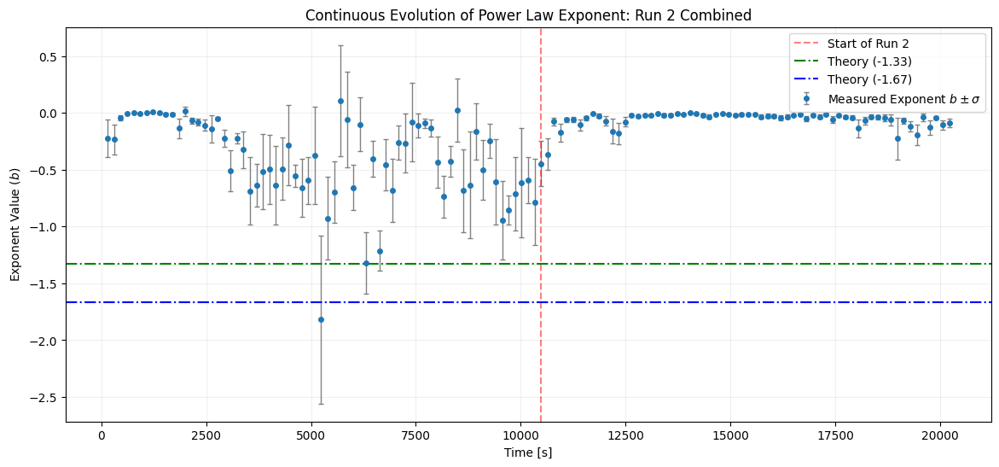

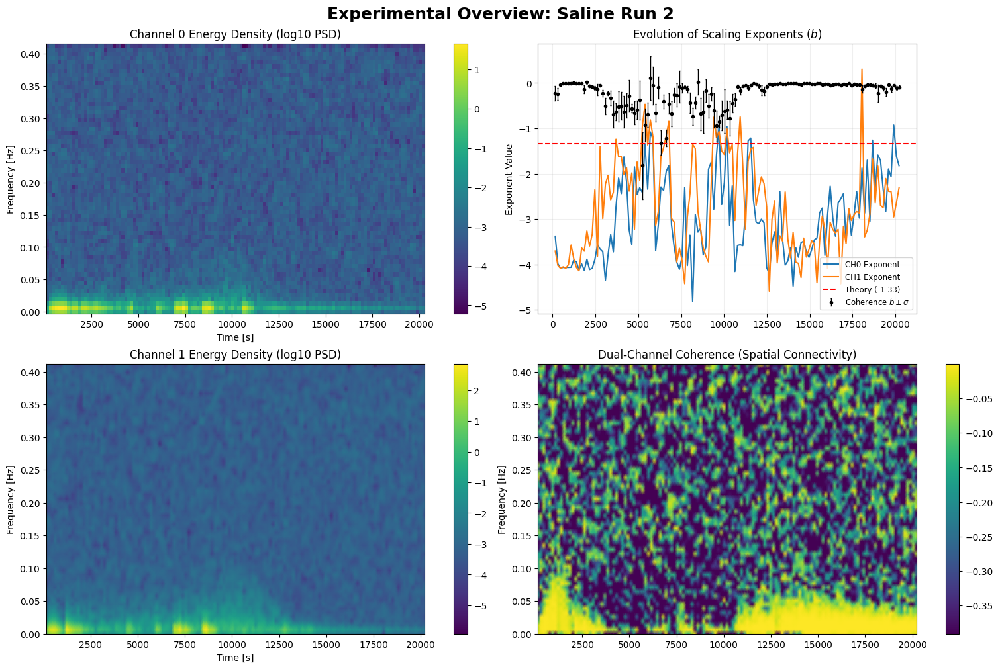

In [ ]:
## Run 2.1


# Coherence 
window_sizecoh1, step_sizecoh1, npersegcoh1 =   256, 128, 128
win_tcoh1, fcoh1, Z_cohcoh1, _, _, a_cohcoh1, b_cohcoh1, b_err_cohcoh1 = coherenceData(CH2run2_1, CH3run2_1, timerun2_1, window_size=window_sizecoh1, step_size=step_sizecoh1, nperseg=npersegcoh1, logaxis=False, freq_range=[0.005,0.04])


# CH0
window_size021, step_size021, nperseg021 =  256, 128, 128
_, _, Z_psd021, _, _, a_psd021, b_psd021, b_err_psd021 = singleWelch(CH2run2_1, timerun2_1, window_size=window_size021, step_size=step_size021, nperseg=nperseg021, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

## CH1
window_size121, step_size121, nperseg121 =  256, 128, 128
_, _, Z_psd121, _, _, a_psd121, b_psd121, b_err_psd121 = singleWelch(CH3run2_1, timerun2_1, window_size=window_size121, step_size=step_size121, nperseg=nperseg121, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Run 2.2


timerun2_R, CH2run2_yR = rangeSelector(CH2run2_2, timerun2_2, [0, 10000])
timerun2_R, CH3run2_yR = rangeSelector(CH3run2_2, timerun2_2, [0, 10000])

# Coherence 
window_sizecoh2, step_sizecoh2, npersegcoh2 =  256, 128, 128
win_tcoh2, fcoh2, Z_cohcoh2, _, _, a_cohcoh2, b_cohcoh2, b_err_cohcoh2 = coherenceData(CH2run2_yR, CH3run2_yR, timerun2_R, window_size=window_sizecoh2, step_size=step_sizecoh2, nperseg=npersegcoh2, logaxis=False, freq_range=[0.005,0.04])

# CH0
window_size022, step_size022, nperseg022 =   256, 128, 128
_, _, Z_psd022, _, _, a_psd022, b_psd022, b_err_psd022 = singleWelch(CH2run2_yR, timerun2_R, window_size=window_size022, step_size=step_size022, nperseg=nperseg022, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# # CH1
window_size122, step_size122, nperseg122 =   256, 128, 128
_, _, Z_psd122, _, _, a_psd122, b_psd122, b_err_psd122 = singleWelch(CH3run2_yR, timerun2_R, window_size=window_size122, step_size=step_size122, nperseg=nperseg122, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Assembled

if not np.allclose(fcoh1, fcoh2):
    print("Warning: Frequencies do not match exactly. Heatmaps may not align!")
    # Use fcoh1 as the master frequency
    f_total = fcoh1
else:
    f_total = fcoh1
# --- 2. Concatenate 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Stack 2D Matrices (Heatmaps) ---
# np.hstack adds the new columns (time windows) to the right of the first matrix
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# Z_psd0tot = np.concatenate([Z_psd031, Z_psd032])
# a_psd0tot = np.concatenate([a_psd031, a_psd032])
# b_psd0tot = np.concatenate([b_psd031, b_psd032])
# b_err_psd0tot = np.concatenate([b_err_psd031, b_err_psd032])

# # --- 3. Stack 2D Matrices (Heatmaps) ---
# # np.hstack adds the new columns (time windows) to the right of the first matrix


# Z_psd1tot = np.concatenate([Z_psd131, Z_psd132])
# a_psd1tot = np.concatenate([a_psd131, a_psd132])
# b_psd1tot = np.concatenate([b_psd131, b_psd132])
# b_err_psd1tot = np.concatenate([b_err_psd131, b_err_psd132])

import numpy as np

# --- 1. Handle Time Offset ---
# Calculate the end of the first run
t_end_run1 = win_tcoh1[-1] 
# Shift run 2 so it starts right after run 1
win_tcoh2_shifted = win_tcoh2 + t_end_run1

# --- 2. Merge 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2_shifted])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Merge 2D Matrices (The Heatmaps) ---
# We use hstack (horizontal stack) to add columns for the new time windows
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# --- 4. Merge PSD variables if you have them for the dashboard ---
# (Repeat the same logic for Z_psd0, Z_psd1, b_psd0, b_psd1)
Z_psd0_total = np.hstack([Z_psd021, Z_psd022])
Z_psd1_total = np.hstack([Z_psd121, Z_psd122])
b_psd0_total = np.concatenate([b_psd021, b_psd022])
b_psd1_total = np.concatenate([b_psd121, b_psd122])

# --- 5. Frequency ---
# We assume the frequency bins are the same for both runs
f_total = fcoh1


# --- 3. Plot the combined Evolution ---
plt.figure(figsize=(14, 6))

# Plot the combined data
plt.errorbar(win_t_total, b_coh_total, yerr=b_err_total, fmt='o', 
             ecolor='gray', elinewidth=1, capsize=2, ms=4, 
             label='Measured Exponent $b \pm \sigma$')

# Add a vertical line to show where Run 2 starts
plt.axvline(x=win_tcoh1[-1], color='red', linestyle='--', alpha=0.5, label='Start of Run 2')

# Add theoretical reference lines
plt.axhline(-1.33, color='green', ls='-.', label='Theory (-1.33)')
plt.axhline(-1.67, color='blue', ls='-.', label='Theory (-1.67)')

plt.xlabel("Time [s]")
plt.ylabel("Exponent Value ($b$)")
plt.title("Continuous Evolution of Power Law Exponent: Run 2 Combined")
plt.legend()
plt.grid(True, alpha=0.2)
plt.show()

plotOverviewDashboard("Saline Run 2", f_total, win_t_total, Z_coh_total, Z_psd0_total, Z_psd1_total, b_coh_total, b_psd0_total, b_psd1_total, a_coh_total, b_errors=b_err_total)



[550.202 549.829 549.235 ... 540.498 541.077 541.846]
27376
[0.         0.00081132 0.00162265 0.00243397 0.00324529 0.00405661
 0.00486794 0.00567926 0.00649058 0.0073019  0.00811323 0.00892455
 0.00973587 0.01054719 0.01135852 0.01216984 0.01298116 0.01379248
 0.01460381 0.01541513 0.01622645 0.01703777 0.0178491  0.01866042
 0.01947174 0.02028306 0.02109439 0.02190571 0.02271703 0.02352835
 0.02433968 0.025151   0.02596232 0.02677364 0.02758497 0.02839629
 0.02920761 0.03001893 0.03083026 0.03164158 0.0324529  0.03326422
 0.03407555 0.03488687 0.03569819 0.03650951 0.03732084 0.03813216
 0.03894348 0.0397548  0.04056613 0.04137745 0.04218877 0.04300009
 0.04381142 0.04462274 0.04543406 0.04624539 0.04705671 0.04786803
 0.04867935 0.04949068 0.050302   0.05111332 0.05192464 0.05273597
 0.05354729 0.05435861 0.05516993 0.05598126 0.05679258 0.0576039
 0.05841522 0.05922655 0.06003787 0.06084919 0.06166051 0.06247184
 0.06328316 0.06409448 0.0649058  0.06571713 0.06652845 0.06733977
 0.

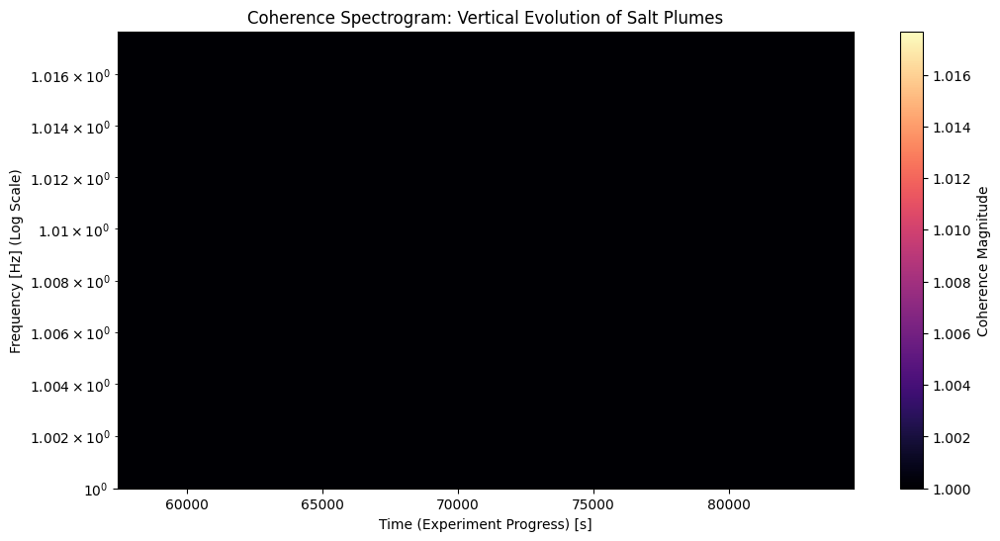

Total points in Data: 27376
Time starts at: 55000.827
Time ends at: 87952.472
Expected number of windows: 22


NameError: name 'gaussian_filter' is not defined

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import coherence
import matplotlib.colors as colors
print(CH1_yR)
print(len(CH1_yR))
# --- Parameters ---
window_size = 4096        # Reduced to 10k to get more "slices" over time
step_size = 1024          
nperseg = 1024           

windows_time = []
coherence_matrix = []
freqs = None

for start in range(0, len(CH1_yR) - window_size, step_size):
    end = start + window_size
    
    c1, c2 = CH1_yR[start:end], CH0_yR[start:end]
    t_chunk = CH0_timeR[start:end]
    
    # Calculate local sampling rate
    fs_val = 1.0 / np.mean(np.diff(t_chunk))
    
    f, Cxy = coherence(c1, c2, fs=fs_val, nperseg=nperseg)
    
    if freqs is None: freqs = f
    coherence_matrix.append(Cxy)
    windows_time.append(np.mean(t_chunk))

# Convert to array
Z = np.array(coherence_matrix).T 
print(freqs)
freqs_log = np.log10(np.array(freqs)+10)

# --- Plotting ---
plt.figure(figsize=(12, 6))

# Using LogNorm to see the power-law decay clearly
from matplotlib.colors import LogNorm
im = plt.pcolormesh(windows_time, freqs_log, Z, shading='gouraud', 
               vmin=freqs_log.min(), vmax=freqs_log.max(), cmap='magma')

plt.ylabel('Frequency [Hz] (Log Scale)')
plt.yscale("log")
plt.xlabel('Time (Experiment Progress) [s]')
plt.title('Coherence Spectrogram: Vertical Evolution of Salt Plumes')
plt.colorbar(im, label='Coherence Magnitude')
plt.show()






print(f"Total points in Data: {len(CH1_yR)}")
print(f"Time starts at: {CH0_timeR[0]}")
print(f"Time ends at: {CH0_timeR[-1]}")
print(f"Expected number of windows: {(len(CH1_yR) - window_size) // step_size}")

# 1. Prepare the Data
# We use log10 to see the power-law decay properly
# Adding 1e-4 prevents log(0) errors

# 2. Smooth the surface 
# sigma=(1, 1) smooths slightly across both Time and Frequency to remove 'spikes'
windows_time, freqs, Z_log, _, _, a_cohcoh2, b_cohcoh2, b_err_cohcoh2 = coherenceData(CH0run3_1, CH1run3_1, timerun3_1, window_size=window_size, step_size=step_size, nperseg=nperseg,  logaxis=False, freq_range=[0.005,0.04])
Z_smooth = gaussian_filter(Z_log, sigma=1.0)

# 3. Create Meshgrid
# X = Frequency, Y = Time
X_mesh, Y_mesh = np.meshgrid(freqs, windows_time)

fig = plt.figure(figsize=(14, 9))
ax = fig.add_subplot(111, projection='3d')

# 4. Plot Surface
# 'antialiased=True' makes the power-law slope look cleaner
my_norm = colors.Normalize(vmin=Z.min(), vmax=Z.max())

surf = ax.plot_surface(X_mesh, Y_mesh, Z_smooth.T, cmap='magma', norm=my_norm,
                       edgecolor='none', alpha=1, antialiased=True)

# 5. Formatting the 3D View
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel('Time (Experiment Progress) [s]')
ax.set_zlabel('log10(Coherence)')
ax.set_title('3D Spectral Evolution of Axial Temperature Coherence')

# Optional: Limit the view to the physical range where the signal is strong

# Add a colorbar to show the magnitude
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)

# Set the initial viewing angle (elev, azim)
ax.view_init(elev=30, azim=-60)

plt.show()

In [ ]:
epsilon=0.0001
indices = np.where((CH3run3_1_fd < epsilon) & (CH3run3_1_fd > -epsilon))[0]
print(f"Indices where derivative is zero: {indices}")
# Let 'idx_zero' be your array of indices where derivative == 0
# Let 'data' be your original temperature array

# 1. Find where the gaps are (where index[i+1] - index[i] > 1)
# This identifies the "jump" between different plateaus
gaps = np.where(np.diff(indices) > 300)[0] + 1

# 2. Split the indices into separate groups (one for each plateau)
plateau_groups = np.split(indices, gaps)

plateau_averages = []

print("--- Plateau Analysis ---")
for i, region in enumerate(plateau_groups):
    # Skip very small "glitches" (e.g., regions with fewer than 10 points)
    if len(region) < 10:
        continue
        
    # Extract the actual temperature values for these indices
    values = CH3_yR[region]
    
    avg_temp = np.mean(values)
    start_time = timerun3_1[region[0]]
    end_time = timerun3_1[region[-1]]
    
    plateau_averages.append(avg_temp)
    
    print(f"Plateau {i+1}: Start {start_time:.1f}s, End {end_time:.1f}s, Avg Temp: {avg_temp:.2f} °C")

print(plateau_averages)

epsilons = [0.01, 0.001, 0.0001, 0.00001]  # Example epsilon values for different thresholds
plt.figure(figsize=(10, 6))
for i in range(len(epsilons)):
    epsilon = epsilons[i]
    indices = np.where((CH3run3_1_fd > -epsilon) & (CH3run3_1_fd < epsilon))[0]
    plt.scatter(CH3_timeR[indices], CH3_yR[indices], label=f'|dT/dt| < {epsilon}', s=0.5)

plt.xlabel("Time [s]")
plt.ylabel("Temperature [°C]")
plt.title(r"Regions $|dT/dt| < \epsilon$ for varying $\epsilon$ (Run 3)")

plt.plot(CH3_timeR, CH3_yR, color='gray', alpha=0.5)
for i, region in enumerate(plateau_groups):
    if len(region) > 10:
        plt.hlines(y=np.mean(CH3_yR[region]), xmin=CH3_timeR[region[0]], xmax=CH3_timeR[region[-1]], 
                   color='red', linewidth=3, label=f"T = {np.mean(CH3run3_1[region]):.2f} °C")
plt.legend()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

# --- Configuration ---
dt = np.mean(np.diff(timerun2))
fs_val = 1.0 / dt

grad = CH1run2 - CH0run2

# Define your 5 time windows (xmin, xmax)
windows = [
    (6000, 7000), (7700, 8800), (9100, 10700)
]
windows_grad = [r"$\Delta T = 19 \degree C$", r"$\Delta T = 25 \degree C$",
                r"$\Delta T = 34 \degree C$"]


plt.figure(figsize=(12, 7))

# Use a colormap to make the windows look distinct (e.g., transition from blue to red)
colors = plt.cm.viridis(np.linspace(0, 1, len(windows)))
for i, (xmin, xmax) in enumerate(windows):
    # 1. Mask and Extract
    mask = (timerun2 >= xmin) & (timerun2 <= xmax)
    segment_grad = grad[mask]
    
    if len(segment_grad) < 128: # Skip if window is empty or too short
        continue

    # 2. Detrend the segment to remove slow thermal drift
    seg_detrended = signal.detrend(segment_grad)
    
    # 3. Calculate PSD using Welch's Method
    # nperseg controls the "smoothness" vs "resolution". 
    # For ~1000s windows, 512 is usually a sweet spot.
    f, psd = signal.welch(seg_detrended, fs=fs_val, nperseg=512)
    
    # 4. Plot each line
    plt.semilogy(f, psd, color=colors[i], label=f'Window {i+1}: {xmin}-{xmax}s, {windows_grad[i]}', alpha=0.8)

    # 5. Identify the peak for this specific window
    peak_idx = np.argmax(psd)
    print(f"Window {i+1} Peak: {f[peak_idx]:.4f} Hz (Period: {1/f[peak_idx]:.2f} s)")

# --- Formatting the Chart ---
plt.title("Evolution of Thermal Gradient Oscillations in Molten NaCl-MgCl2-CeCl3", fontsize=14)
plt.xlabel("Frequency [Hz]", fontsize=12)
plt.ylabel("Power Spectral Density [(ΔT)² / Hz]", fontsize=12)
plt.grid(True, which="both", ls="-", alpha=0.3)
plt.legend()
plt.xlim(0, fs_val / 2) # Show up to the Nyquist frequency
plt.tight_layout()
plt.show()

In [ ]:
from scipy.signal import coherence

# 1. Calculate the Coherence between the two heights
# This tells you: "At frequency X, how much do these two sensors agree?"
f_coh, coh = coherence(CH2run2[mask], CH3run2[mask], fs=fs_val, nperseg=512)

plt.figure(figsize=(10, 4))
plt.plot(f_coh, coh, color='teal')
plt.title("Coherence between 15mm and 55mm Sensors")
plt.xlabel("Frequency [Hz]")
plt.ylabel("Coherence (0 to 1)")
plt.grid(True)
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

# --- 1. Data Selection & Masking ---
xmin, xmax = 4000, 10700
mask = (timerun2 >= xmin) & (timerun2 <= xmax)

xw = timerun2[mask]
yw = CH2run2[mask]   # Channel 1
y2w = CH3run2[mask]  # Channel 2

# --- 2. Plotting ---
fig, ax = plt.subplots(figsize=(10, 6))

# Define your specific colors here
color_ch2 = "#8A424F"   # Example: Deep Red
color_ch3 = "#DB0028"      # Example: Blue-Green

# Standard plot for solid colors
ax.plot(xw, yw, color=color_ch2, linewidth=1.2, label="CH2 (15mm)")
ax.plot(xw, y2w, color=color_ch3, linewidth=1.2, label="CH3 (55mm)")

# --- 3. Events & Annotations ---
# Only show events that fall within our xmin/xmax window
events = [
    (4600, r"$\downarrow$ 7 [mm]"),
    (5600, r"$\downarrow$ Argon flow"),
    (6000, r"$\downarrow$ 5 [mm]"),
    (7000, r"$\downarrow$ 10 [mm]"),
    (7200, r"$T_{f} = 900 [°C]$"),
    (7700, r"$\uparrow$ Argon flow"),
    (8000, r"$14V$ cooling"),
    (8500, r"$\downarrow$ 10 [mm]"),
    (8750, r"$T_{f} = 1000 [°C]$")
]

# Calculate Y-limits for scaling
ymin_win = min(yw.min(), y2w.min())
ymax_win = max(yw.max(), y2w.max())
y_range = ymax_win - ymin_win
pad = 0.05 * y_range if y_range > 0 else 1.0

for x, label in events:
    if xmin <= x <= xmax:
        ax.axvline(x=x, linestyle="-.", linewidth=1, alpha=0.5, color="black")
        # Place label at 90% of the visible height
        ax.annotate(
            label,
            xy=(x, ymin_win + 0.85* y_range),
            xytext=(0, 5), textcoords="offset points",
            ha="center", va="bottom",
            rotation=90,
            fontsize=8,
            bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="none", alpha=0.7)
        )

# --- 4. Formatting ---
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin_win - pad, ymax_win + pad)

ax.set_xlabel("Time [s]")
ax.set_ylabel(r"Temperature [°C]") # Changed to Temp since it's raw CH data
ax.set_title("Thermal Gradient Over Time (Molten Salt)")

ax.legend(loc='lower right')
ax.grid(True, which="both", ls="-", alpha=0.2)

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy import signal

# --- 1. Data Selection ---
full_mask = (time >= 4000) & (time <= 10700)
t_v = time[full_mask]
c0_v, c1_v, c2_v, c3_v = CH0[full_mask], CH1[full_mask], CH2[full_mask], CH3[full_mask]
g_v = c1_v - c0_v 
fs_val = 1.0 / np.mean(np.diff(t_v))

windows = [(6000, 7000), (7700, 8800), (9100, 10700)]
cmap_name = 'viridis'
norm_grad = plt.Normalize(g_v.min(), g_v.max())
cmap = plt.get_cmap(cmap_name)

# --- 2. Create Figure ---
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 18))

# --- ROW 1: All 4 Channels ---

ax1.plot(t_v, c0_v, label='CH0:Upper salt (Cold salt)', color="#2E5C36")
ax1.plot(t_v, c1_v, label='CH1: Lower salt (Hot salt)', color="#00DB27")
ax1.plot(t_v, c2_v, label='CH3: Upper crucible', color="#8A424F")
ax1.plot(t_v, c3_v, label='CH2: Lower crucible', color="#DB0028")


# Auto-scaling y-axis
y_all = np.concatenate([c0_v, c1_v, c2_v, c3_v])
ax1.set_ylim(y_all.min() * 0.98, y_all.max() * 1.05) # Extra top pad for text
ax1.set_xlim(4000, 10700)
ax1.set_ylabel("Temp [°C]")
ax1.legend(loc='upper right', ncol=2)

# --- ROW 2: Gradient (Heatmap) ---
points = np.column_stack([t_v, g_v]).reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
lc = LineCollection(segments, cmap=cmap_name, norm=norm_grad)
lc.set_array(g_v)
lc.set_linewidth(1.5)
ax2.add_collection(lc)

ax2.set_xlim(4000, 10700)
ax2.set_ylim(g_v.min() - 2, g_v.max() + 5)
ax2.set_ylabel(r"$\Delta T$ [°C]")

# FIX: Aligning the X-axis by using a dedicated divider for the colorbar
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="2%", pad=0.1)
fig.colorbar(lc, cax=cax, label=r'Grad [°C]')

# --- ROW 3: Windowed PSD ---
for i, (w_start, w_end) in enumerate(windows):
    w_mask = (time >= w_start) & (time <= w_end)
    seg_g = (CH1 - CH0)[w_mask]
    avg_val = np.mean(seg_g)
    win_color = cmap(norm_grad(avg_val))
    
    f, psd = signal.welch(signal.detrend(seg_g), fs=fs_val, nperseg=512)
    ax3.semilogy(f, psd, color=win_color, lw=1, label=f'Window {i+1}: {w_start}-{w_end}s, {windows_grad[i]}: ~{avg_val:.1f}°C')

ax3.set_xlim(0, max(f))
ax3.set_xlabel("Frequency [Hz]")
ax3.set_ylabel("Power [(ΔT)² / Hz]")
ax3.legend()

# --- Shared Annotations (Fixing the Clipping) ---
for ax in [ax1, ax2]:
    for x, label in events:
        if 4000 <= x <= 10700:
            # 1. Draw the vertical line
            ax.axvline(x=x, color='black', linestyle='-', alpha=0.3, zorder=1)
            
            # 2. Place the text INSIDE the plot area
            # 'transform=ax.get_xaxis_transform()' allows us to set 
            # X in data coordinates (seconds) and Y in axis coordinates (0 to 1)
            ax.annotate(
                label, 
                xy=(x, 0.95),  # 95% of the way up the plot
                xycoords=ax.get_xaxis_transform(),
                rotation=90, 
                va='top',      # Align the top of the text to the 95% mark
                ha='center', 
                fontsize=8, 
                fontweight='normal',
                color='black',
                bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="gray", alpha=0.7)
            )

# Add titles manually to ensure they don't hit the event labels
ax1.set_title("CH 0-3: Temperature Profile", pad=10, fontweight='normal')
ax2.set_title(r"Thermal Gradient $\Delta T$ (Intrasaline, CH1 - CH0)", pad=10, fontweight='normal')
ax3.set_title(r"Spectral analysis of $\Delta T$ plateaus", pad=10, fontweight='normal')
ax1.grid(True, color='gray', linestyle='--', alpha=0.3)
ax2.grid(True, color='gray', linestyle='--', alpha=0.3)
ax3.grid(True, color='gray', linestyle='--', alpha=0.3)

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Manual adjustment to prevent clipping at the very top
plt.show()

# Stable Gradient Seeker

In [ ]:
grad = CH1run3_1 - CH0run3_1

window_length = 1000  # Must be odd and less than the length of grad
polyorder = 2

grad_filtered, grad_derivative = savgolCompilator(grad, window_length=window_length, polyorder=polyorder)
grad_filtered, grad_double_derivative = savgolCompilator(grad, window_length=window_length, polyorder=polyorder, deriv=2, delta=1.0)

savgolCalcPlotter(grad, timerun3_1, window_length=window_length, polyorder=polyorder, deriv=1, delta=1.0)

# 3. Plotting Smoothed and Derivative 
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 8), sharex=False)

# Top Plot: Raw vs Smoothed
ax1.plot(timerun3_1, grad, label='Raw', color='teal', lw=2)
ax1.plot(timerun3_1, grad_filtered, label='Savgol Smoothed', color='crimson', lw=2)
ax1.set_ylabel("Temperature [°C]")
ax1.set_title("Raw vs Smoothed $T$ profile CH1 (Lower salt) - Run 1")
ax1.set_xlabel("Time [s]")
ax1.legend()

# Middle Plot: The Derivative
ax2.plot(timerun3_1, grad_derivative, color='crimson', lw=1.5)
ax2.set_ylabel("Rate of Change [°C/s]")
ax2.set_title("First Derivative (dT/dt) versus smoothed $T$ for Run 3")
ax2.grid(True, alpha=0.3)

# Bottom Plot: Double derivative
ax3.plot(timerun3_1, grad_double_derivative, color='crimson', lw=1.5)
#ax2.plot(tR1_750, TdR1_750, color='magenta', lw=1.5)
ax3.set_ylabel("Rate of Change [°C/s]")  # Focus on the same time window as before
ax3.set_xlabel("Temperature [°C]")
#ax2.set_xlim(10,46)
#ax2.set_ylim(-0.05, 0.05)
ax3.set_title(r"Double Derivative (d²T/dt²) versus smoothed $T$ for Run 3")
ax3.grid(True, alpha=0.3)


In [ ]:
epsilon=0.001
indices = np.where((grad_derivative < epsilon) & (grad_derivative > -epsilon))[0]
print(f"Indices where derivative is zero: {indices}")
# Let 'idx_zero' be your array of indices where derivative == 0
# Let 'data' be your original temperature array

# 1. Find where the gaps are (where index[i+1] - index[i] > 1)
# This identifies the "jump" between different plateaus
gaps = np.where(np.diff(indices) > 300)[0] + 1

# 2. Split the indices into separate groups (one for each plateau)
plateau_groups = np.split(indices, gaps)

plateau_averages = []

print("--- Plateau Analysis ---")
for i, region in enumerate(plateau_groups):
    # Skip very small "glitches" (e.g., regions with fewer than 10 points)
    if len(region) < 10:
        continue
        
    # Extract the actual temperature values for these indices
    values = grad[region]
    
    avg_temp = np.mean(values)
    start_time = timerun3_1[region[0]]
    end_time = timerun3_1[region[-1]]
    
    plateau_averages.append(avg_temp)
    
    print(f"Plateau {i+1}: Start {start_time:.1f}s, End {end_time:.1f}s, Avg Temp: {avg_temp:.2f} °C")

print(plateau_averages)

epsilons = [0.01, 0.005, 0.001, 0.0001]  # Example epsilon values for different thresholds
plt.figure(figsize=(10, 6))
for i in range(len(epsilons)):
    epsilon = epsilons[i]
    indices = np.where((grad_derivative > -epsilon) & (grad_derivative < epsilon))[0]
    plt.scatter(timerun3_1[indices], grad[indices], label=f'|dT/dt| < {epsilon}', s=0.5)

plt.xlabel("Time [s]")
plt.ylabel("Temperature [°C]")
plt.title(r"Regions $|dT/dt| < \epsilon$ for varying $\epsilon$ (Run 3)")

plt.plot(timerun3_1, grad, color='gray', alpha=0.5)
for i, region in enumerate(plateau_groups):
    if len(region) > 10:
        plt.hlines(y=np.mean(grad[region]), xmin=timerun3_1[region[0]], xmax=timerun3_1[region[-1]], 
                   color='red', linewidth=3, label=f"T = {np.mean(grad[region]):.2f} °C")
plt.legend()
plt.show()


In [ ]:
from scipy.stats import linregress

print("--- Drift Analysis ---")
for i, region in enumerate(plateau_groups):
    if len(region) < 100: continue
    
    t_data = timerun3_1[region]
    temp_data = grad[region]
    
    # Perform linear regression on the plateau
    slope, intercept, r_value, p_value, std_err = linregress(t_data, temp_data)
    
    # A slope of 0.001 °C/s means it gains 1 degree every 1000 seconds
    drift_rate_per_hour = slope * 3600 
    
    print(f"Plateau {i+1}: Slope = {slope:.6f} °C/s ({drift_rate_per_hour:.2f} °C/hr)")
    
    if p_value < 0.05 and abs(slope) > 1e-4:
        print("   >> WARNING: Statistically significant upward trend detected.")

    plt.plot(plateau_groups[i], slope * timerun3_1[plateau_groups[i]] + intercept, color='orange', linestyle='--', label=f"Drift Fit (Plateau {i+1})")

In [ ]:
plt.figure(figsize=(12, 7))
plt.plot(timerun3_1, grad, color='gray', alpha=0.3)

# Sort groups by time to ensure the zigzag looks consistent left-to-right
plateau_groups = sorted(plateau_groups, key=lambda x: timerun3_1[x[0]])

# Define a set of heights (in points) to cycle through
# Level 0: 10pts, Level 1: 35pts, Level 2: 60pts
height_levels = [10, 35, 60]
level_idx = 0


epsilon = 0.001
plt.scatter(timerun3_1[indices], grad[indices], label=f'|dT/dt| < {epsilon}', s=0.5)


for i, region in enumerate(plateau_groups):
    if len(region) < 50:
        continue
        
    avg_grad = np.mean(grad[region])
    t_start = timerun3_1[region[0]]
    t_end = timerun3_1[region[-1]]
    t_mid = (t_start + t_end) / 2
    
    # 1. Select the height level for this label and increment the cycle
    current_offset = height_levels[level_idx % len(height_levels)]
    level_idx += 1 
    
    # 2. Draw the horizontal line
    plt.hlines(y=avg_grad, xmin=t_start, xmax=t_end, color='red', linewidth=2.5)
    
    # 3. Annotate with a "Stem" (the vertical line connecting text to data)
    plt.annotate(
        f"{avg_grad:.2f} °C", 
        xy=(t_mid, avg_grad), 
        xytext=(0, current_offset), 
        textcoords="offset points",
        ha='center', va='bottom',
        fontsize=9, fontweight='bold',
        color='red',
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="red", alpha=0.9),
        # This adds a thin line connecting the box to the plateau
        arrowprops=dict(arrowstyle='-', color='red', alpha=0.4, lw=1)
    )

plt.title("Staggered Plateau Labels (No Overlap)")
plt.xlabel("Time [s]")
plt.ylabel(r"$\Delta$T [°C]")
plt.grid(True, alpha=0.2)
plt.show()

In [ ]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# 1. IDENTIFY INDICES (Use your specific epsilon)
epsilon = 0.001
indices = np.where((grad_derivative < epsilon) & (grad_derivative > -epsilon))[0]

# 2. GROUPING (Use your gap threshold of 100)
gaps = np.where(np.diff(indices) > 100)[0] + 1
plateau_groups = np.split(indices, gaps)

# --- PLOTTING ---
fig, ax1 = plt.subplots(figsize=(14, 10))

# Plot raw data
ax1.plot(timerun3_1, grad, color='darkgray', label='Raw Gradient', lw=1)

# Plot the scatter points for the steady state regions
ax1.scatter(timerun3_1[indices], grad[indices], color='black', s=5.0, 
            label=f'Steady State (|dT/dt| < $\\epsilon$)')

# Sort groups by time
plateau_groups = sorted(plateau_groups, key=lambda x: timerun3_1[x[0]])

# Define staggering levels
height_levels = [10, 30, 40, 50] # Added a 4th level for high-density packing
level_idx = 0

print("--- Plateau Analysis ---")
for i, region in enumerate(plateau_groups):
    # MATCH YOUR REFERENCE CODE: Use > 10 so nothing is missed
    if len(region) <= 10:
        continue
        
    avg_grad = np.mean(grad[region])
    t_start = timerun3_1[region[0]]
    t_end = timerun3_1[region[-1]]
    t_mid = (t_start + t_end) / 2
    
    # Select height level
    current_offset = height_levels[level_idx % len(height_levels)]
    level_idx += 1 
    
    # 1. Draw the horizontal line (Red)
    ax1.hlines(y=avg_grad, xmin=t_start, xmax=t_end, color='red', linewidth=2.5, zorder=5)
    
    # 2. Annotate EVERY plateau
    ax1.annotate(
        f"{avg_grad:.2f} °C", 
        xy=(t_mid, avg_grad), 
        xytext=(0, current_offset), 
        textcoords="offset points",
        ha='center', va='bottom',
        fontsize=8, fontweight='bold', # Smaller font helps with packing
        color='red',
        bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="red", alpha=0.9, lw=1),
        arrowprops=dict(arrowstyle='-', color='red', alpha=0.3, lw=0.8),
        zorder=6
    )
    
    print(f"Region {i+1}: Avg {avg_grad:.2f} °C | Points: {len(region)}")

ax1.set_title(f"Detected plateaus using Savintsky-Golay Smoothing and Differentiation with parameters: w = {window_length}, p = {polyorder}, $\\epsilon$ = {epsilon}", fontweight='bold')
ax1.set_xlabel("Time [s]")
ax1.set_ylabel(r"Temperature [°C]")
ax1.set_xlim(timerun3_1[0], timerun3_1[-1])
ax1.grid(True, alpha=0.2)
ax1.legend(loc='best')



# --- 1. SET THE ZOOM WINDOW ---
# Choose the X-range you want to "Highlight" in the top right
x_zoom_start, x_zoom_end = 4000, 10000

# ... [Insert your existing Plateau Labeling Loop here] ...

# --- 3. THE INSET PLOT (The "Top Right" Detail) ---
# [x_pos, y_pos, width, height] as fractions of the main plot (0 to 1)
ax_ins = ax1.inset_axes([4000/timerun3_1[len(timerun3_1)-1], 4000/timerun3_1[len(timerun3_1)-1], (10000-4000)/timerun3_1[len(timerun3_1)-1], 0.5]) 

# Plot the SAME data into the inset
#ax_ins.scatter(timerun2[indices], grad[indices], color='black', s=3)
#ax_ins.plot(timerun2, grad, color='darkgray', lw=1)
ax_ins.plot(immersionTime_run3_1[:, 0], immersionTime_run3_1[:, 1], color='blue', lw=1.0, label='Immersion Depth [mm]')


# SUBSET the view for the inset
mask_zoom = (timerun3_1 >= x_zoom_start) & (timerun3_1 <= x_zoom_end)
y_min, y_max = np.min(immersionTime_run3_1[mask_zoom, 1]), np.max(immersionTime_run3_1[mask_zoom, 1])

ax_ins.set_xlim(x_zoom_start, x_zoom_end)
ax_ins.set_ylim(y_min - 1, y_max + 1) # Auto-scale Y to the zoom window

# Clean up the inset look
ax_ins.set_title(f"Furnace & Immersion depth profile", fontsize=9, fontweight='bold')
ax_ins.tick_params(labelsize=8)
ax_ins.set_xlabel("Time [s]", fontsize=8)
ax_ins.set_ylabel(r"Immersion Depth [mm]", fontsize=8, color='blue')
ax_ins.grid(True, alpha=0.2)

ax_ins2 = ax_ins.twinx()
ax_ins2.plot(temperatureTime_run3_1[:, 0], temperatureTime_run3_1[:, 1], color='magenta', lw=1.0, label='dT/dt')
ax_ins2.set_ylabel("Furnace Temp [°C]", color='magenta', fontsize=8)


# Final Formatting
ax1.set_xlabel("Time [s]")
ax1.set_ylabel(r"$\Delta$T [°C]")
ax1.legend(loc='lower left') 
plt.show()


In [ ]:
print(indices)
# Let 'idx_zero' be your array of indices where derivative == 0
# Let 'data' be your original temperature array

# 1. Find where the gaps are (where index[i+1] - index[i] > 1)
# This identifies the "jump" between different plateaus
gaps = np.where(np.diff(indices) > 100)[0] + 1

# 2. Split the indices into separate groups (one for each plateau)
plateau_groups = np.split(indices, gaps)

# 3. Calculate the average for each specific region

# Result: plateau_averages now contains one value per plateau

# 3D Plotting: Immersion, Furnace Temperature, Gradient

# Differential Analysis of Temperature Profiles and Gradients $\Delta T$

Using Savintsky-Golay Filtering and Derivatives


In [ ]:
import numpy as np
import matplotlib.pyplot as plt


# This function applies the Savitzky-Golay filter to a given channel of data, 
# allowing for both smoothing and differentiation


In [ ]:
# 1. Data Processing
## Parameters for Savitzky-Golay filter
window = 51 # Size of the "window" moving across the data
poly = 4 # Degree of polynomial used inside the window for fitting

## Data 
# "Ts" means "temperature smoothed"
# "Td" means "temperature derivative"

### Run 2
TsR2, TdR2 = savgol_compilation(CH1run2, window_length=window, 
                                polyorder=poly, deriv=1)
tR2 = timerun2 # redefine time for simpler notation

### Run 1 @ 750 degree C
TsR1_750, TdR1_750 = savgol_compilation(CH0run1_75015mm, window_length=window, 
                                        polyorder=poly, deriv=1)
tR1_750 = timerun1_75015mm 

# 3. Plotting Smoothed and Derivative 
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=False)

# Top Plot: Raw vs Smoothed
ax1.plot(tR2, TsR2, label='Savgol Smoothed', color='crimson', lw=2)
ax1.plot(tR2, CH1run2, label='Raw', color='teal', lw=2)
ax1.set_ylabel("Temperature [°C]")
ax1.set_title("Raw vs Smoothed $T$ profile CH1 (Lower salt) - Run 2")
ax1.set_xlabel("Time [s]")
ax1.set_xlim(0,4000)
ax1.legend()

# Bottom Plot: The Derivative
ax2.plot(TsR2, TdR2, color='crimson', lw=1.5)
#ax2.plot(tR1_750, TdR1_750, color='magenta', lw=1.5)
ax2.set_ylabel("Rate of Change [°C/s]")  # Focus on the same time window as before
ax2.set_xlabel("Temperature [°C]")
ax2.set_title(r"First Derivative (dT/dt) versus smoothed $T$ for Run 2")
ax2.set_xlim(0,600)

plt.tight_layout()
plt.show()

In [ ]:
# This function calculates and plots the Smoothed Temp and derivative of the desired order. 


savgolCalcPlotter(CH1run2, timerun2, window_length=51, polyorder=4, deriv=1, delta=1.0)


In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib as mpl

grad = CH3run2 - CH1run2
xmin, xmax = 0, 4000

mask = (timerun2 >= xmin) & (timerun2 <= xmax)
xw = timerun2[mask]
yw = grad[mask]


# Build line segments (N-1 segments, each with 2 points)
points = np.column_stack([xw, yw]).reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)

# Normalize colors to window range
norm = mpl.colors.Normalize(vmin=yw.min(), vmax=yw.max())
lc = LineCollection(segments, cmap="viridis", norm=norm)
lc.set_array(yw[:-1])      # color each segment by y-value
lc.set_linewidth(1.0)

fig, ax = plt.subplots(figsize=(10, 6))
ax.add_collection(lc)

ax.set_xlim(xmin, xmax)
pad = 0.01*(yw.max()-yw.min()) if yw.max()>yw.min() else 1e-6
ax.set_ylim(yw.min()-pad, yw.max()+pad)



# (event_time, label)
events = [
    (1700, "Melting event"),
]

# y-limits (window-based) so labels place nicely
mask = (timerun2 >= xmin) & (timerun2 <= xmax)
ywin = grad[mask]
ymin, ymax = ywin.min(), ywin.max()
pad = 0.01*(ymax - ymin) if ymax > ymin else 1e-6
ax.set_ylim(ymin - pad, ymax + pad)

for x, label in events:
    ax.axvline(x=x, linestyle="-.", linewidth=1, alpha=0.8, color="black")
    ax.annotate(
        label,
        xy=(x,0.85*ymax),          # anchor at top of plot in data coords
        xytext=(0, 6), textcoords="offset points",
        ha="center", va="bottom",
        rotation=90,
        fontsize=7,
        bbox=dict(boxstyle="round,pad=0.1", fc="white", ec="none", alpha=0.8)
    )

ax.set_xlabel("Time [s]")
ax.set_ylabel(r"$\Delta$T [°C]")
ax.set_title("Thermal Gradient (Extrasaline)")

cbar = fig.colorbar(lc, ax=ax)
cbar.set_label("[°C]")

plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

# --- 1. CONFIGURATION ---
# Replace these with your chosen channels and melting time window
t_array = time       # Your time array
s_channel = CH1      # The channel inside the salt (Sample)
r_channel = CH3      # The channel outside the salt (Reference)

# Define the start and end of the melting event (in seconds)
melt_start, melt_end = 1200, 1600 

# --- 2. SMOOTHING ---
# Window length must be odd (e.g., 51, 101). Larger = smoother.
window = 101 
s_smooth = signal.savgol_filter(s_channel, window, 3)
r_smooth = signal.savgol_filter(r_channel, window, 3)

# Calculate the Differential Signal (DTA)
delta_t = s_smooth - r_smooth

# --- 3. MASKING & INTEGRATION ---
mask = (t_array >= melt_start) & (t_array <= melt_end)
t_melt = t_array[mask]
dt_melt = delta_t[mask]

# Calculate Area (Enthalpy Proxy)
# We use a try/except to handle different versions of NumPy/SciPy
try:
    area = np.trapz(dt_melt, t_melt)
except AttributeError:
    # Newest versions of NumPy/SciPy use 'trapezoid'
    from scipy.integrate import trapezoid
    area = trapezoid(dt_melt, t_melt)

# --- 4. VISUAL VERIFICATION ---
plt.figure(figsize=(10, 5))
plt.plot(t_array, delta_t, label='Smoothed $\Delta T$ (S - R)', color='black')
plt.fill_between(t_melt, dt_melt, color='orange', alpha=0.3, label=f'Melt Area: {area:.2f} °C·s')
plt.axvspan(melt_start, melt_end, color='gray', alpha=0.1, label='Integration Window')

plt.title("Differential Thermal Analysis (DTA) - Melting Peak")
plt.xlabel("Time [s]")
plt.ylabel("$\Delta T$ [°C]")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print(f"Calculated Enthalpy Proxy (Area): {area:.2f} °C·s")